In [1]:
# sparsity=0 no pruning, bit=ap_fix<16,6>, reuse  
# reuse=[overrall= , ]
# CIFAR10
# original model accuracy=%, hlsmodel accuarcy=%  
# output_dir = Desktop/hls4ml_experiment/

In [4]:
# https://keras.io/zh/examples/cifar10_resnet/
from __future__ import print_function

import matplotlib.pyplot as plt
import numpy as np
import time
import tensorflow_datasets as tfds
import hls4ml

from tensorflow.keras.utils import to_categorical
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

import tensorflow as tf
import os

import plotting
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.regularizers import l1
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense

from tensorflow.keras.models import Model

from tensorflow.keras.models import load_model
import tensorflow.keras as keras

from sklearn.datasets import fetch_openml


import tensorflow.keras as keras
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, BatchNormalization, Activation
from tensorflow.keras.layers import AveragePooling2D, Input, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l2
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.datasets import cifar10

os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'
os.environ['PATH'] = '/tools/Xilinx/Vitis_HLS/2020.1/bin:/tools/Xilinx/Vivado/2020.1/bin:/tools/Xilinx/Vitis/2020.1/bin:'+ os.environ['PATH']


# https://blog.csdn.net/weixin_45092662/article/details/117109615
os.environ['CUDA_VISIBLE_DEVICES']="0" 
config=tf.compat.v1.ConfigProto() 
# config.gpu_options.per_process_gpu_memory_fraction=0.8
config.gpu_options.allow_growth = True  
sess=tf.compat.v1.Session(config=config)


2022-08-10 13:51:26.518383: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-10 13:51:26.520392: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:41:00.0 name: NVIDIA RTX A6000 computeCapability: 8.6
coreClock: 1.8GHz coreCount: 84 deviceMemorySize: 47.54GiB deviceMemoryBandwidth: 715.34GiB/s
2022-08-10 13:51:26.520428: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2022-08-10 13:51:26.520454: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2022-08-10 13:51:26.520469: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.11
2022-08-10 13:51:26.520483: I tensorflow/stream_executor/platfo

In [5]:
# Training parameters
batch_size = 32  # orig paper trained all networks with batch_size=128
epochs = 200
data_augmentation = True
num_classes = 10

# Subtracting pixel mean improves accuracy
subtract_pixel_mean = True
# Load the CIFAR10 data.
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Input image dimensions.
input_shape = x_train.shape[1:]

# Normalize data.
x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255

# If subtract pixel mean is enabled
if subtract_pixel_mean:
    x_train_mean = np.mean(x_train, axis=0)
    x_train -= x_train_mean
    x_test -= x_train_mean

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')
print('y_train shape:', y_train.shape)

# Convert class vectors to binary class matrices.
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples
y_train shape: (50000, 1)


In [6]:
from tensorflow.keras import layers

# Subtracting pixel mean improves accuracy
subtract_pixel_mean = True

# Model parameter
# ----------------------------------------------------------------------------
#           |      | 200-epoch | Orig Paper| 200-epoch | Orig Paper| sec/epoch
# Model     |  n   | ResNet v1 | ResNet v1 | ResNet v2 | ResNet v2 | GTX1080Ti
#           |v1(v2)| %Accuracy | %Accuracy | %Accuracy | %Accuracy | v1 (v2)
# ----------------------------------------------------------------------------
# ResNet20  | 3 (2)| 92.16     | 91.25     | -----     | -----     | 35 (---)
# ResNet32  | 5(NA)| 92.46     | 92.49     | NA        | NA        | 50 ( NA)
# ResNet44  | 7(NA)| 92.50     | 92.83     | NA        | NA        | 70 ( NA)
# ResNet56  | 9 (6)| 92.71     | 93.03     | 93.01     | NA        | 90 (100)
# ResNet110 |18(12)| 92.65     | 93.39+-.16| 93.15     | 93.63     | 165(180)
# ResNet164 |27(18)| -----     | 94.07     | -----     | 94.54     | ---(---)
# ResNet1001| (111)| -----     | 92.39     | -----     | 95.08+-.14| ---(---)
# ---------------------------------------------------------------------------
n = 3

# Model version
# Orig paper: version = 1 (ResNet v1), Improved ResNet: version = 2 (ResNet v2)
version = 1

# Computed depth from supplied model parameter n
if version == 1:
    depth = n * 6 + 2
elif version == 2:
    depth = n * 9 + 2

# Model name, depth and version
model_type = 'ResNet%dv%d' % (depth, version)

# # Load the CIFAR10 data.
# # (x_train, y_train), (x_test, y_test) = cifar10.load_data()

# # Input image dimensions.
# input_shape = x_train.shape[1:]

# # Normalize data.
# x_train = x_train.astype('float32') / 255
# x_test = x_test.astype('float32') / 255

# # If subtract pixel mean is enabled
# if subtract_pixel_mean:
#     x_train_mean = np.mean(x_train, axis=0)
#     x_train -= x_train_mean
#     x_test -= x_train_mean

# print('x_train shape:', x_train.shape)
# print(x_train.shape[0], 'train samples')
# print(x_test.shape[0], 'test samples')
# print('y_train shape:', y_train.shape)

# # Convert class vectors to binary class matrices.
# y_train = keras.utils.to_categorical(y_train, num_classes)
# y_test = keras.utils.to_categorical(y_test, num_classes)


def lr_schedule(epoch):
    """Learning Rate Schedule

    Learning rate is scheduled to be reduced after 80, 120, 160, 180 epochs.
    Called automatically every epoch as part of callbacks during training.

    # Arguments
        epoch (int): The number of epochs

    # Returns
        lr (float32): learning rate
    """
    lr = 1e-3
    if epoch > 180:
        lr *= 0.5e-3
    elif epoch > 160:
        lr *= 1e-3
    elif epoch > 120:
        lr *= 1e-2
    elif epoch > 80:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr


def resnet_layer(inputs,
                 num_filters=16,
                 kernel_size=3,
                 strides=1,
                 activation='relu',
                 batch_normalization=True,
                 conv_first=True, indx=0):
    """2D Convolution-Batch Normalization-Activation stack builder

    # Arguments
        inputs (tensor): input tensor from input image or previous layer
        num_filters (int): Conv2D number of filters
        kernel_size (int): Conv2D square kernel dimensions
        strides (int): Conv2D square stride dimensions
        activation (string): activation name
        batch_normalization (bool): whether to include batch normalization
        conv_first (bool): conv-bn-activation (True) or
            bn-activation-conv (False)

    # Returns
        x (tensor): tensor as input to the next layer
    """
#     conv = Conv2D(num_filters,
#                   kernel_size=kernel_size,
#                   strides=strides,
#                   padding='same',
#                   kernel_initializer='he_normal',
#                   kernel_regularizer=l2(1e-4), name = "default_conv")

    x = inputs
    if conv_first:
#         x = conv(x, name= 'conv{}_1'.format(indx))
        x = Conv2D(num_filters,
                  kernel_size=kernel_size,
                  strides=strides,
                  padding='same',
                  kernel_initializer='he_normal',
                  kernel_regularizer=l2(1e-4), name= 'conv{}_1'.format(indx))(x)
        if batch_normalization:
            x = BatchNormalization()(x)
        if activation is not None:
            x = Activation(activation)(x)
    else:
        if batch_normalization:
            x = BatchNormalization()(x)
        if activation is not None:
            x = Activation(activation)(x)
#         x = conv(x, name= 'conv{}_2'.format(indx))
        x = Conv2D(num_filters,
          kernel_size=kernel_size,
          strides=strides,
          padding='same',
          kernel_initializer='he_normal',
          kernel_regularizer=l2(1e-4), name= 'conv{}_2'.format(indx))(x)
    return x


def resnet_v1(input_shape, depth, num_classes=10):
    """ResNet Version 1 Model builder [a]

    Stacks of 2 x (3 x 3) Conv2D-BN-ReLU
    Last ReLU is after the shortcut connection.
    At the beginning of each stage, the feature map size is halved (downsampled)
    by a convolutional layer with strides=2, while the number of filters is
    doubled. Within each stage, the layers have the same number filters and the
    same number of filters.
    Features maps sizes:
    stage 0: 32x32, 16
    stage 1: 16x16, 32
    stage 2:  8x8,  64
    The Number of parameters is approx the same as Table 6 of [a]:
    ResNet20 0.27M
    ResNet32 0.46M
    ResNet44 0.66M
    ResNet56 0.85M
    ResNet110 1.7M

    # Arguments
        input_shape (tensor): shape of input image tensor
        depth (int): number of core convolutional layers
        num_classes (int): number of classes (CIFAR10 has 10)

    # Returns
        model (Model): Keras model instance
    """
    if (depth - 2) % 6 != 0:
        raise ValueError('depth should be 6n+2 (eg 20, 32, 44 in [a])')
    # Start model definition.
    num_filters = 16
    num_res_blocks = int((depth - 2) / 6)

    inputs = Input(shape=input_shape)
    indx = 0
    x = resnet_layer(inputs=inputs)
    indx = indx +1
    # Instantiate the stack of residual units
    for stack in range(3):
        for res_block in range(num_res_blocks):
            strides = 1
            if stack > 0 and res_block == 0:  # first layer but not first stack
                strides = 2  # downsample
            y = resnet_layer(inputs=x,
                             num_filters=num_filters,
                             strides=strides,indx=indx)
            indx = indx + 1
            y = resnet_layer(inputs=y,
                             num_filters=num_filters,
                             activation=None,indx=indx)
            indx = indx + 1
            
            if stack > 0 and res_block == 0:  # first layer but not first stack
                # linear projection residual shortcut connection to match
                # changed dims
                x = resnet_layer(inputs=x,
                                 num_filters=num_filters,
                                 kernel_size=1,
                                 strides=strides,
                                 activation=None,
                                 batch_normalization=False, indx=indx)
                indx = indx +1
            x = keras.layers.add([x, y])
            x = Activation('relu')(x)
        num_filters *= 2

    # Add classifier on top.
    # v1 does not use BN after last shortcut connection-ReLU
    
    x = AveragePooling2D(pool_size=8,name='averagepool')(x)
    y = Flatten(name = 'flattenlayer')(x)
    x = Dense(num_classes,
                    activation=None,
                    kernel_initializer='he_normal', name ='output_dense')(y)
  
    outputs = Activation('softmax',name='output_softmax')(x)

    # Instantiate model.
    model = Model(inputs=inputs, outputs=outputs)
    return model



model = resnet_v1(input_shape=input_shape, depth=depth)

2022-08-10 13:51:27.534254: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-10 13:51:27.535442: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:41:00.0 name: NVIDIA RTX A6000 computeCapability: 8.6
coreClock: 1.8GHz coreCount: 84 deviceMemorySize: 47.54GiB deviceMemoryBandwidth: 715.34GiB/s
2022-08-10 13:51:27.535473: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2022-08-10 13:51:27.535496: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2022-08-10 13:51:27.535506: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.11
2022-08-10 13:51:27.535517: I tensorflow/stream_executor/platfo

In [7]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv0_1 (Conv2D)                (None, 32, 32, 16)   448         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 32, 32, 16)   64          conv0_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, 32, 32, 16)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [8]:
import tensorflow_model_optimization as tfmot
from tensorflow_model_optimization.sparsity import keras as sparsity
from tensorflow_model_optimization.python.core.sparsity.keras import pruning_callbacks


train_size = 50000

NSTEPS = int(train_size)  // batch_size 
print('Number of training steps per epoch is {}'.format(NSTEPS))

# Prune all convolutional and dense layers gradually from 0 to 50% sparsity every 2 epochs, 
# ending by the 10th epoch
# def pruneFunction(layer):
#     pruning_params = {'pruning_schedule': sparsity.PolynomialDecay(initial_sparsity = 0.0,
#                                                                    final_sparsity = 0.50, 
#                                                                    begin_step = NSTEPS*2, 
#                                                                    end_step = NSTEPS*10, 
#                                                                    frequency = NSTEPS)
#                      }
#     if isinstance(layer, tf.keras.layers.Conv2D):
#         return tfmot.sparsity.keras.prune_low_magnitude(layer, **pruning_params)
#     if isinstance(layer, tf.keras.layers.Dense) and layer.name!='output_dense':
#         return tfmot.sparsity.keras.prune_low_magnitude(layer, **pruning_params)  
#     return layer

# model = tf.keras.models.clone_model( model, clone_function=pruneFunction)
# model.summary()

Number of training steps per epoch is 1562


In [9]:
from callbacks import all_callbacks



# Prepare model model saving directory.
save_dir = os.path.join(os.getcwd(), 'saved_models')
model_name = 'cifar10_%s_model.{epoch:03d}.h5' % model_type
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
filepath = os.path.join(save_dir, model_name)


print('Using real-time data augmentation.')
# This will do preprocessing and realtime data augmentation:
datagen = ImageDataGenerator(
    # set input mean to 0 over the dataset
    featurewise_center=False,
    # set each sample mean to 0
    samplewise_center=False,
    # divide inputs by std of dataset
    featurewise_std_normalization=False,
    # divide each input by its std
    samplewise_std_normalization=False,
    # apply ZCA whitening
    zca_whitening=False,
    # epsilon for ZCA whitening
    zca_epsilon=1e-06,
    # randomly rotate images in the range (deg 0 to 180)
    rotation_range=0,
    # randomly shift images horizontally
    width_shift_range=0.1,
    # randomly shift images vertically
    height_shift_range=0.1,
    # set range for random shear
    shear_range=0.,
    # set range for random zoom
    zoom_range=0.,
    # set range for random channel shifts
    channel_shift_range=0.,
    # set mode for filling points outside the input boundaries
    fill_mode='nearest',
    # value used for fill_mode = "constant"
    cval=0.,
    # randomly flip images
    horizontal_flip=True,
    # randomly flip images
    vertical_flip=False,
    # set rescaling factor (applied before any other transformation)
    rescale=None,
    # set function that will be applied on each input
    preprocessing_function=None,
    # image data format, either "channels_first" or "channels_last"
    data_format=None,
    # fraction of images reserved for validation (strictly between 0 and 1)
    validation_split=0.0)

# Compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied).
datagen.fit(x_train)


# Prepare callbacks for model saving and for learning rate adjustment.
checkpoint = ModelCheckpoint(filepath=filepath,
                             monitor='val_acc',
                             verbose=1,
                             save_best_only=True)

lr_scheduler = LearningRateScheduler(lr_schedule)

lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=5,
                               min_lr=0.5e-6)

callbacks = [checkpoint, lr_reducer, lr_scheduler, pruning_callbacks.UpdatePruningStep()]

model.compile(loss='categorical_crossentropy',
              optimizer=Adam(lr=lr_schedule(0)),
              metrics=['accuracy'])

# Fit the model on the batches generated by datagen.flow().
# model.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
#                     validation_data=(x_test, y_test),
#                     epochs=5, verbose=1, workers=4,
#                     callbacks=callbacks)

# # Score trained model.
# scores = model.evaluate(x_test, y_test, verbose=1)
# print('Test loss:', scores[0])
# print('Test accuracy:', scores[1])

Using real-time data augmentation.
Learning rate:  0.001


# Check sparsity


In [7]:
# model.save('resnet_pruned.h5')

In [10]:
from tensorflow_model_optimization.sparsity.keras import strip_pruning
from tensorflow_model_optimization.python.core.sparsity.keras import pruning_wrapper
from qkeras.utils import _add_supported_quantized_objects

# co = {}
# _add_supported_quantized_objects(co)
# co['PruneLowMagnitude'] = pruning_wrapper.PruneLowMagnitude
# model = tf.keras.models.load_model('resnet_pruned70.h5', custom_objects=co)
# model  = strip_pruning(model)

In [9]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv0_1 (Conv2D)                (None, 32, 32, 16)   448         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 32, 32, 16)   64          conv0_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, 32, 32, 16)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

## performance

In [11]:
from tensorflow_model_optimization.sparsity.keras import strip_pruning
from tensorflow_model_optimization.python.core.sparsity.keras import pruning_wrapper
from qkeras.utils import _add_supported_quantized_objects
import tensorflow_model_optimization as tfmot
from tensorflow_model_optimization.sparsity import keras as sparsity
from tensorflow_model_optimization.python.core.sparsity.keras import pruning_callbacks

model = tf.keras.models.load_model('resnet20_cifar10.h5')
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(lr=lr_schedule(0)),
              metrics=['accuracy'])
predict_baseline    = model.predict(x_test)
test_score_baseline = model.evaluate(x_test, y_test, batch_size = 128)

print('Keras accuracy = {} '.format(test_score_baseline[1]))

Learning rate:  0.001


2022-08-10 13:51:36.285909: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2022-08-10 13:51:36.471706: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2022-08-10 13:51:36.822580: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.11
2022-08-10 13:51:36.824168: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.8
2022-08-10 13:51:37.833176: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2022-08-10 13:51:37.890394: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2022-08-10 13:51:

79/79 [==============================] - 11s 4ms/step - loss: 0.4221 - accuracy: 0.9207
Keras accuracy = 0.91839998960495 


Layer conv0_1: % of zeros = 0.0
Layer conv1_1: % of zeros = 0.0
Layer conv2_1: % of zeros = 0.0
Layer conv3_1: % of zeros = 0.0
Layer conv4_1: % of zeros = 0.0
Layer conv5_1: % of zeros = 0.0
Layer conv6_1: % of zeros = 0.0
Layer conv7_1: % of zeros = 0.0
Layer conv8_1: % of zeros = 0.0
Layer conv9_1: % of zeros = 0.0
Layer conv10_1: % of zeros = 0.0
Layer conv11_1: % of zeros = 0.0
Layer conv12_1: % of zeros = 0.0
Layer conv13_1: % of zeros = 0.0
Layer conv14_1: % of zeros = 0.0
Layer conv15_1: % of zeros = 0.0
Layer conv16_1: % of zeros = 0.0
Layer conv17_1: % of zeros = 0.0
Layer conv18_1: % of zeros = 0.0
Layer conv19_1: % of zeros = 0.0
Layer conv20_1: % of zeros = 0.0
Layer output_dense: % of zeros = 0.0


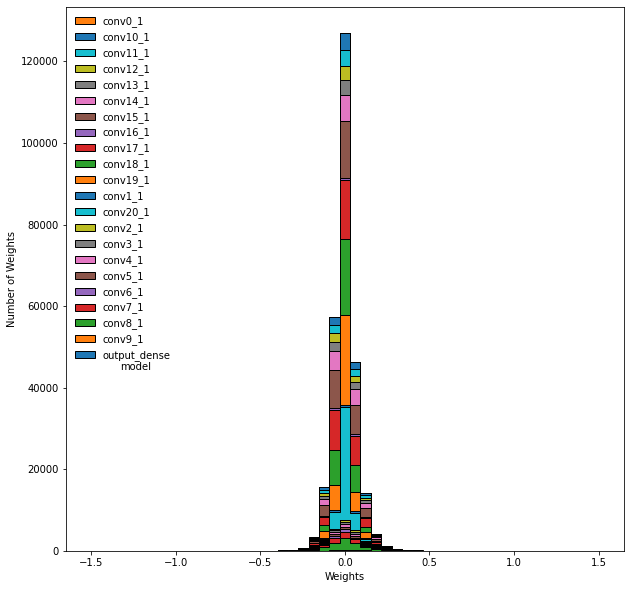

In [21]:
def doWeights(model):

    allWeightsByLayer = {}
    for layer in model.layers:
        if (layer._name).find("batch")!=-1 or len(layer.get_weights())<1:
            continue 
        weights=layer.weights[0].numpy().flatten()  
        allWeightsByLayer[layer._name] = weights
        print('Layer {}: % of zeros = {}'.format(layer._name,np.sum(weights==0)/np.size(weights)))

    labelsW = []
    histosW = []

    for key in reversed(sorted(allWeightsByLayer.keys())):
        labelsW.append(key)
        histosW.append(allWeightsByLayer[key])

    fig = plt.figure(figsize=(10,10))
    bins = np.linspace(-1.5, 1.5, 50)
    plt.hist(histosW,bins,histtype='stepfilled',stacked=True,label=labelsW, edgecolor='black')
    plt.legend(frameon=False,loc='upper left')
    plt.ylabel('Number of Weights')
    plt.xlabel('Weights')
    plt.figtext(0.2, 0.38,model._name, wrap=True, horizontalalignment='left',verticalalignment='center')
    
doWeights(model) 


In [22]:
# model.save('resnet20.h5')

# remove softmax

In [23]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv0_1 (Conv2D)                (None, 32, 32, 16)   448         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 32, 32, 16)   64          conv0_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, 32, 32, 16)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

# hls config

In [12]:
# Training parameters
batch_size = 32  # orig paper trained all networks with batch_size=128
epochs = 200
data_augmentation = True
num_classes = 10

# Subtracting pixel mean improves accuracy
subtract_pixel_mean = True
# Load the CIFAR10 data.
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Input image dimensions.
input_shape = x_train.shape[1:]

# Normalize data.
x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255

# If subtract pixel mean is enabled
if subtract_pixel_mean:
    x_train_mean = np.mean(x_train, axis=0)
    x_train -= x_train_mean
    x_test -= x_train_mean

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')
print('y_train shape:', y_train.shape)

# Convert class vectors to binary class matrices.
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples
y_train shape: (50000, 1)


In [13]:

print("-----------------------------------")
print("Configuration")


hls4ml.model.optimizer.get_optimizer('output_rounding_saturation_mode').configure(layers=['Activation'], rounding_mode='AP_RND', saturation_mode='AP_SAT')

hls_config = hls4ml.utils.config_from_keras_model(model, granularity='name')    
# hls_config ['LayerName']['output_softmax']['exp_table_t'] = 'ap_fixed<18,8>'
# hls_config ['LayerName']['output_softmax']['inv_table_t'] = 'ap_fixed<18,4>'



# If one layer would have >4096 elements, we sould set ['Strategy'] = 'Resource' for that layer, 
# or increase the reuse factor by hand. 
# Set the precision and reuse factor for the full model
hls_config['Model']['Strategy'] = 'Resource'
hls_config['Model']['ReuseFactor'] = 64
hls_config['Model']['Precision'] = 'ap_fixed<16,6>' #



conv_list_1 = ['conv1_1', 'conv2_1','conv3_1', 'conv4_1','conv5_1', 'conv6_1']
conv_list_2 = ['conv10_1', 'conv11_1','conv12_1']
conv_list_3 = ['conv17_1', 'conv18_1','conv19_1', 'conv20_1']
for Layer in hls_config['LayerName'].keys():
    hls_config['LayerName'][Layer]['ReuseFactor'] = 64
    hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<16,6>'
    hls_config['LayerName'][Layer]['Trace'] = True

    if Layer == "conv0_1":
        hls_config['LayerName'][Layer]['ReuseFactor'] = 432
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<32,16>'
    
    if Layer in conv_list_1:
        hls_config['LayerName'][Layer]['ReuseFactor'] = 2304
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<32,16>'

    if Layer == "conv7_1":
        hls_config['LayerName'][Layer]['ReuseFactor'] = 4608
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<16,6>' 
    
    if Layer == "conv8_1":
        hls_config['LayerName'][Layer]['ReuseFactor'] = 9216
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<16,6>' 
        
    if Layer == "conv9_1":
        hls_config['LayerName'][Layer]['ReuseFactor'] = 256
        
    if Layer in conv_list_2:
        hls_config['LayerName'][Layer]['ReuseFactor'] = 9216
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<16,6>'
    
    if Layer == "conv13_1":
        hls_config['LayerName'][Layer]['ReuseFactor'] = 9216
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<32,16>'
    
    if Layer == "conv14_1":
        hls_config['LayerName'][Layer]['ReuseFactor'] = 18432
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<32,16>'
    
    if Layer == "conv15_1":
        hls_config['LayerName'][Layer]['ReuseFactor'] = 36864
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<16,6>'
        
    if Layer == "conv16_1":
        hls_config['LayerName'][Layer]['ReuseFactor'] = 256
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<16,6>'
    
    if Layer in conv_list_3:
        hls_config['LayerName'][Layer]['ReuseFactor'] = 36864
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<16,6>'   
      
    if Layer == "output_dense":
        hls_config['LayerName'][Layer]['ReuseFactor'] = 128
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<32,16>' 
    
    if Layer == "output_softmax":
        hls_config['LayerName'][Layer]['Strategy'] = 'Stable'  
        hls_config['LayerName'][Layer]['ReuseFactor'] = 2
#         hls_config['LayerName'][Layer]['Precision'] = 'ap_fixed<32,16>'        


        
#If you want best numerical performance for high-accuray models, 
#while the default latency strategy is faster but numerically more unstable
# hls_config['LayerName']['output_softmax']['Strategy'] = 'Stable'
# plotting.print_dict(hls_config)


plotting.print_dict(hls_config)
print("-----------------------------------")
# hls_model = hls4ml.converters.convert_from_keras_model(
#     model, 
#     hls_config=hls_config,
#     output_dir='model_1/hls4ml_prj', 
#     part='xcu250-figd2104-2L-e'
#     )



-----------------------------------
Configuration
Interpreting Model
Topology:
Layer name: input_1, layer type: Input
Layer name: conv0_1, layer type: Conv2D
  -> Activation (linear), layer name: conv0_1
Layer name: batch_normalization, layer type: BatchNormalization
Layer name: activation, layer type: Activation
Layer name: conv1_1, layer type: Conv2D
  -> Activation (linear), layer name: conv1_1
Layer name: batch_normalization_1, layer type: BatchNormalization
Layer name: activation_1, layer type: Activation
Layer name: conv2_1, layer type: Conv2D
  -> Activation (linear), layer name: conv2_1
Layer name: batch_normalization_2, layer type: BatchNormalization
Layer name: add, layer type: Add
Layer name: activation_2, layer type: Activation
Layer name: conv3_1, layer type: Conv2D
  -> Activation (linear), layer name: conv3_1
Layer name: batch_normalization_3, layer type: BatchNormalization
Layer name: activation_3, layer type: Activation
Layer name: conv4_1, layer type: Conv2D
  -> Acti

In [14]:
cfg = hls4ml.converters.create_config(board='alveo-u280', clock_period= 2, part='xcu280-fsvh2892-2L-e', backend='VivadoAccelerator')
cfg['HLSConfig'] = hls_config

cfg['AcceleratorConfig']['Driver']    = 'python'
cfg['AcceleratorConfig']['Board']     = 'alveo-u280'
cfg['AcceleratorConfig']['Interface'] = 'axi_stream'
#cfg['AcceleratorConfig']['Interface'] = 'axi_lite'
#cfg['AcceleratorConfig']['Interface'] = 'axi_master'
cfg['AcceleratorConfig']['Precision']['Input']  = 'float'
cfg['AcceleratorConfig']['Precision']['Output'] = 'float'
cfg['AcceleratorConfig']['Platform'] = 'xilinx_u280_xdma_201920_3'

cfg['IOType']= 'io_stream'
cfg['KerasModel'] = model
cfg['OutputDir'] = 'model_1_u280/hls4ml_prj'


print("-----------------------------------")
plotting.print_dict(cfg)
print("-----------------------------------")
hls_model = hls4ml.converters.keras_to_hls(cfg)
hls4ml.model.optimizer.get_optimizer('output_rounding_saturation_mode').configure(layers=[])
# hls4ml.model.profiling.numerical(model=model, hls_model=hls_model, X=x_test[:1000])

-----------------------------------
OutputDir:           model_1_u280/hls4ml_prj
ProjectName:         myproject
Backend:             VivadoAccelerator
Part:                xcu280-fsvh2892-2L-e
ClockPeriod:         2
IOType:              io_stream
HLSConfig
  Model
    Precision:       ap_fixed<16,6>
    ReuseFactor:     64
    Strategy:        Resource
  LayerName
    input_1
      Precision:     ap_fixed<16,6>
      ReuseFactor:   64
      Trace:         True
    conv0_1
      Precision:     ap_fixed<16,6>
      ReuseFactor:   432
      Trace:         True
    conv0_1_linear
      Precision:     ap_fixed<16,6>
      ReuseFactor:   64
      table_size:    1024
      table_t:       ap_fixed<18,8>
      Trace:         True
    batch_normalization
      Precision:     ap_fixed<16,6>
      ReuseFactor:   64
      Trace:         True
    activation
      Precision:     ap_fixed<16,6>
      ReuseFactor:   64
      table_size:    1024
      table_t:       ap_fixed<18,8>
      Trace:         T

In [15]:
hls_model.compile()

Writing HLS project
Done
Writing HLS project
Done


## full precison pruned model

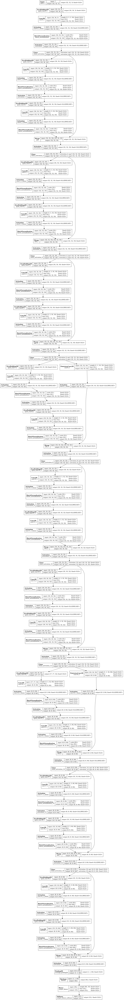

In [29]:
hls4ml.utils.plot_model(hls_model, show_shapes=True, show_precision=True, to_file=None)

Interpreting Model
Topology:
Layer name: input_1, layer type: InputLayer, input shapes: [[None, 32, 32, 3]], output shape: [None, 32, 32, 3]
Layer name: conv0_1, layer type: Conv2D, input shapes: [[None, 32, 32, 3]], output shape: [None, 32, 32, 16]
Layer name: batch_normalization, layer type: BatchNormalization, input shapes: [[None, 32, 32, 16]], output shape: [None, 32, 32, 16]
Layer name: activation, layer type: Activation, input shapes: [[None, 32, 32, 16]], output shape: [None, 32, 32, 16]
Layer name: conv1_1, layer type: Conv2D, input shapes: [[None, 32, 32, 16]], output shape: [None, 32, 32, 16]
Layer name: batch_normalization_1, layer type: BatchNormalization, input shapes: [[None, 32, 32, 16]], output shape: [None, 32, 32, 16]
Layer name: activation_1, layer type: Activation, input shapes: [[None, 32, 32, 16]], output shape: [None, 32, 32, 16]
Layer name: conv2_1, layer type: Conv2D, input shapes: [[None, 32, 32, 16]], output shape: [None, 32, 32, 16]
Layer name: batch_normal

Profiling weights (before optimization)
Profiling weights (final / after optimization)


(<Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>,
 None,
 None)

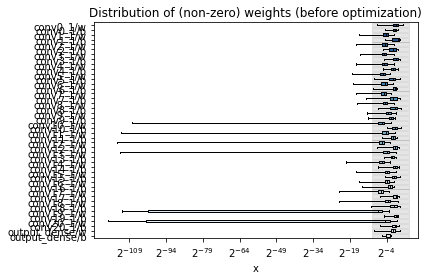

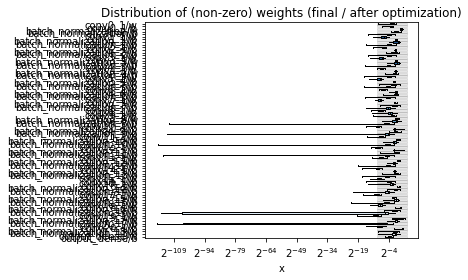

In [30]:
hls4ml.model.profiling.numerical(model=model, hls_model=hls_model)


# HLS model predict

In [31]:
from sklearn.metrics import accuracy_score

def plotROC(Y, y_pred, y_pred_hls4ml, label="Model"):
    
    accuracy_keras  = float(accuracy_score (np.argmax(Y,axis=1), np.argmax(y_pred,axis=1)))
    accuracy_hls4ml = float(accuracy_score (np.argmax(Y,axis=1), np.argmax(y_pred_hls4ml,axis=1)))

    print("Accuracy Keras:  {}".format(accuracy_keras))
    print("Accuracy hls4ml: {}".format(accuracy_hls4ml))
    
    fig, ax = plt.subplots(figsize=(9, 9))
#     _ = plotting.makeRoc(Y, y_pred, labels=['%i'%nr for nr in range(n_classes)])
    plt.gca().set_prop_cycle(None) # reset the colors
    _ = plotting.makeRoc(Y, y_pred_hls4ml, labels=['%i'%nr for nr in range(10)], linestyle='--')

    from matplotlib.lines import Line2D
    lines = [Line2D([0], [0], ls='-'),
             Line2D([0], [0], ls='--')]
    from matplotlib.legend import Legend
    leg = Legend(ax, lines, labels=['Keras', 'hls4ml'],
                loc='lower right', frameon=False)
    ax.add_artist(leg)
    plt.figtext(0.2, 0.38,label, wrap=True, horizontalalignment='left',verticalalignment='center')
    plt.ylim(0.01,1.)
    plt.xlim(0.7,1.)

In [38]:
# X_test_reduced = x_test[:50]
# Y_test_reduced = y_test[:50]
X_test_reduced = x_test
Y_test_reduced = y_test


 model took 0.016478268305460612 minutes to run!


 hls model took 164.95351397196453 minutes to run!

Accuracy Keras:  0.9184
Accuracy hls4ml: 0.877


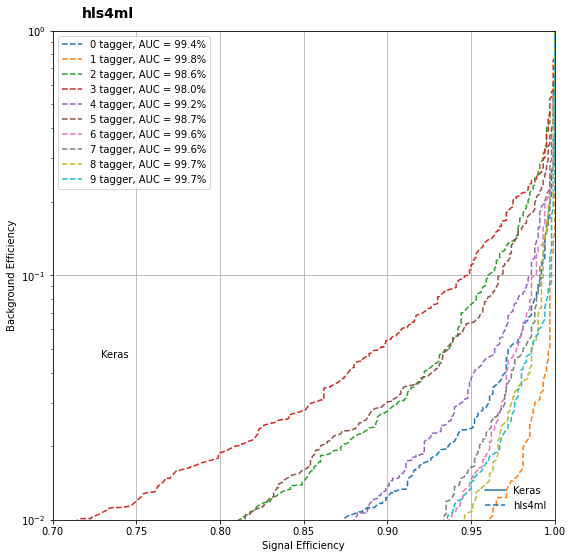

In [39]:
import time
start = time.time()
y_predict = model.predict(X_test_reduced)
end = time.time()
print('\n model took {} minutes to run!\n'.format( (end - start)/60.))

start = time.time()
y_predict_hls4ml = hls_model.predict(np.ascontiguousarray(X_test_reduced))
end = time.time()
print('\n hls model took {} minutes to run!\n'.format( (end - start)/60.))

plotROC(Y_test_reduced, y_predict, y_predict_hls4ml, label="Keras") 

# print(y_predict_hls4ml)

In [34]:
hls_model.build(csim=False,synth=True, vsynth=True, export=True, bitfile=True)
print("build finish")


****** Vivado(TM) HLS - High-Level Synthesis from C, C++ and SystemC v2020.1 (64-bit)
  **** SW Build 2902540 on Wed May 27 19:54:35 MDT 2020
  **** IP Build 2902112 on Wed May 27 22:43:36 MDT 2020
    ** Copyright 1986-2020 Xilinx, Inc. All Rights Reserved.

source /tools/Xilinx/Vivado/2020.1/scripts/vivado_hls/hls.tcl -notrace
INFO: Applying HLS Y2K22 patch v1.2 for IP revision
INFO: [HLS 200-10] Running '/tools/Xilinx/Vivado/2020.1/bin/unwrapped/lnx64.o/vivado_hls'
INFO: [HLS 200-10] For user 'liuh0f' on host 'kw61088.kaust.edu.sa' (Linux_x86_64 version 5.4.0-122-generic) on Mon Jul 25 09:23:24 +03 2022
INFO: [HLS 200-10] On os Ubuntu 18.04.6 LTS
INFO: [HLS 200-10] In directory '/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj'
Sourcing Tcl script 'build_prj.tcl'
INFO: [HLS 200-10] Creating and opening project '/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj'.
INFO: [HLS 200-10] Adding design file 'firmwar

INFO: [HLS 200-10] Analyzing design file 'firmware/myproject_axi.cpp' ... 
INFO: [HLS 200-111] Finished Linking Time (s): cpu = 00:02:25 ; elapsed = 00:02:28 . Memory (MB): peak = 1664.789 ; gain = 1224.723 ; free physical = 301839 ; free virtual = 467312
INFO: [HLS 200-111] Finished Checking Pragmas Time (s): cpu = 00:02:25 ; elapsed = 00:02:28 . Memory (MB): peak = 1664.789 ; gain = 1224.723 ; free physical = 301839 ; free virtual = 467312
INFO: [HLS 200-10] Starting code transformations ...
INFO: [HLS 200-489] Unrolling loop 'MultLoop' (firmware/nnet_utils/nnet_dense_resource.h:159) in function 'void nnet::dense_resource_rf_gt_nin_rem0<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config86_mult>(FORWARD_REFERENCE*, FORWARD_REFERENCE*, FORWARD_REFERENCE::weight_t*, FORWARD_REFERENCE::bias_t*)' completely with a factor of 1.
INFO: [HLS 200-489] Unrolling loop 'MultLoop' (firmware/nnet_utils/nnet_dense_resource.h:159) in function 'void 

INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>::operator[].1' into 'myproject_axi' (firmware/myproject_axi.cpp:24).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>::operator[].1' into 'nnet::fill_data<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, config104>' (firmware/nnet_utils/nnet_padding_stream.h:26).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>::operator[].1' into 'nnet::fill_data<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, config104>' (firmware/nnet_utils/nnet_padding_stream.h:26).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>::operator[].1' into 'nnet::fill_zero<nnet::array<ap_fixed

INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>::operator[]' into 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, linear_config25>' (firmware/nnet_utils/nnet_activation_stream.h:47).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>::operator[]' into 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, relu_config23>' (firmware/nnet_utils/nnet_activation_stream.h:70).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>::operator[]' into 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, relu_config23>' (firmware/nnet_utils/nnet_activation_strea

INFO: [XFORM 203-603] Inlining function 'nnet::fill_zero<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config105>' into 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config105>' (firmware/nnet_utils/nnet_padding_stream.h:63).
INFO: [XFORM 203-603] Inlining function 'nnet::fill_zero<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config105>' into 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config105>' (firmware/nnet_utils/nnet_padding_stream.h:57).
INFO: [XFORM 203-603] Inlining function 'nnet::fill_data<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config105>' into 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet

INFO: [XFORM 203-603] Inlining function 'nnet::fill_zero<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, config108>' into 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, config108>' (firmware/nnet_utils/nnet_padding_stream.h:63).
INFO: [XFORM 203-603] Inlining function 'nnet::fill_zero<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, config108>' into 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, config108>' (firmware/nnet_utils/nnet_padding_stream.h:57).
INFO: [XFORM 203-603] Inlining function 'nnet::fill_data<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, config108>' into 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, nnet

INFO: [XFORM 203-603] Inlining function 'nnet::dense_resource_rf_gt_nin_rem0<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config33_mult>' into 'nnet::dense_resource<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config33_mult>' (firmware/nnet_utils/nnet_dense_resource.h:278).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>::operator[].1' into 'nnet::compute_output_buffer_2d<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config33>' (firmware/nnet_utils/nnet_conv_stream.h:285).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>::operator[].1' into 'nnet::compute_output_buffer_2d<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode

INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>::operator[].1' into 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, linear_config38>' (firmware/nnet_utils/nnet_activation_stream.h:47).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>::operator[].1' into 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, relu_config36>' (firmware/nnet_utils/nnet_activation_stream.h:69).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>::operator[].1' into 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, relu_config36>' (firmware/nnet_utils/nnet_activation

INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>::operator[]' into 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, linear_config40>' (firmware/nnet_utils/nnet_activation_stream.h:47).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>::operator[]' into 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, linear_config38>' (firmware/nnet_utils/nnet_activation_stream.h:47).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>::operator[]' into 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, relu_config36>' (firmware/nnet_utils/nnet_activation_s

INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>::operator[]' into 'nnet::pointwise_mult_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config124>' (firmware/nnet_utils/nnet_sepconv_stream.h:157).
INFO: [XFORM 203-603] Inlining function 'nnet::kernel_shift_2d<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config44>' into 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config44>' (firmware/nnet_utils/nnet_conv_stream.h:235).
INFO: [XFORM 203-603] Inlining function 'nnet::dense_resource_rf_gt_nin_rem0<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config44_mult>' into 'nnet::dense_resource<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config44_mult>' (firmware/nnet_utils/nnet_dense_r

INFO: [XFORM 203-603] Inlining function 'nnet::compute_output_buffer_2d<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config53>' into 'nnet::conv_2d_buffer_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config53>' (firmware/nnet_utils/nnet_conv2d_stream.h:85).
INFO: [XFORM 203-603] Inlining function 'nnet::conv_2d_buffer_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config53>' into 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config53>' (firmware/nnet_utils/nnet_conv2d_stream.h:103).
INFO: [XFORM 203-603] Inlining function 'nnet::fill_zero<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, config116>' into 'nn

INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>::operator[]' into 'nnet::compute_output_buffer_2d<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config73>' (firmware/nnet_utils/nnet_conv_stream.h:285).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>::operator[]' into 'nnet::compute_output_buffer_2d<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config77>' (firmware/nnet_utils/nnet_conv_stream.h:285).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>::operator[]' into 'nnet::fill_data<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config121>' (firmware/nnet_utils/nnet

INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>::operator[]' into 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, linear_config74>' (firmware/nnet_utils/nnet_activation_stream.h:47).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>::operator[]' into 'nnet::clone_stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, 4096>' (firmware/nnet_utils/nnet_stream.h:33).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>::operator[]' into 'nnet::clone_stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, 4096>' (firmware/nnet_utils/nnet_stream.h:32).
INFO: [XFORM 20

INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>::operator[].1' into 'nnet::normalize<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config88>' (firmware/nnet_utils/nnet_batchnorm_stream.h:63).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>::operator[].1' into 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, linear_config87>' (firmware/nnet_utils/nnet_activation_stream.h:47).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>::operator[].1' into 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, relu_config85>' (firmware/nnet_utils/nnet_activation_

INFO: [XFORM 203-603] Inlining function 'nnet::fill_zero<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config118>' into 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config118>' (firmware/nnet_utils/nnet_padding_stream.h:57).
INFO: [XFORM 203-603] Inlining function 'nnet::fill_data<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config118>' into 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config118>' (firmware/nnet_utils/nnet_padding_stream.h:66).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>::operator[]' into 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config66>' (fir

INFO: [XFORM 203-603] Inlining function 'nnet::fill_data<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config121>' into 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config121>' (firmware/nnet_utils/nnet_padding_stream.h:66).
INFO: [XFORM 203-603] Inlining function 'nnet::kernel_shift_2d<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config82>' into 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config82>' (firmware/nnet_utils/nnet_conv_stream.h:235).
INFO: [XFORM 203-603] Inlining function 'nnet::dense_resource_rf_gt_nin_rem0<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config82_mult>' into 'nnet::dense_resource<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mod

INFO: [HLS 200-111] Finished Standard Transforms Time (s): cpu = 00:07:25 ; elapsed = 00:07:29 . Memory (MB): peak = 8285.633 ; gain = 7845.566 ; free physical = 295680 ; free virtual = 461329
INFO: [HLS 200-10] Checking synthesizability ...
INFO: [XFORM 203-602] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config2_mult>' into 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config2>' (firmware/nnet_utils/nnet_dense_resource.h:180->firmware/nnet_utils/nnet_dense_resource.h:278->firmware/nnet_utils/nnet_conv_stream.h:279->firmware/nnet_utils/nnet_conv2d_stream.h:85->firmware/nnet_utils/nnet_conv2d_stream.h:103) automatically.
INFO: [XFORM 203-602] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config6_mult>' into 'nnet::conv_2d_cl<

INFO: [XFORM 203-602] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config62_mult>' into 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config62>' (firmware/nnet_utils/nnet_dense_resource.h:180->firmware/nnet_utils/nnet_dense_resource.h:278->firmware/nnet_utils/nnet_conv_stream.h:279->firmware/nnet_utils/nnet_conv2d_stream.h:85->firmware/nnet_utils/nnet_conv2d_stream.h:103) automatically.
INFO: [XFORM 203-602] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config66_mult>' into 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config66>' (firmware/nnet_utils/nnet_dense_resource.h:180->firmware/nnet_utils/nnet_dense_resource.h:278->

INFO: [SYNCHK 200-10] 0 error(s), 1 warning(s).
INFO: [HLS 200-111] Finished Checking Synthesizability Time (s): cpu = 00:08:05 ; elapsed = 00:08:09 . Memory (MB): peak = 8290.480 ; gain = 7850.414 ; free physical = 295286 ; free virtual = 460974
INFO: [XFORM 203-1101] Packing variable 'out_pack.data.V' (firmware/nnet_utils/nnet_activation_stream.h:166) into a 160-bit variable.
INFO: [XFORM 203-1101] Packing variable 'out_data.data.V' (firmware/nnet_utils/nnet_activation_stream.h:64) into a 1024-bit variable.
INFO: [XFORM 203-1101] Packing variable 'out_data.data.V' (firmware/nnet_utils/nnet_activation_stream.h:64) into a 1024-bit variable.
INFO: [XFORM 203-1101] Packing variable 'out_data.data.V' (firmware/nnet_utils/nnet_activation_stream.h:64) into a 1024-bit variable.
INFO: [XFORM 203-1101] Packing variable 'out_data.data.V' (firmware/nnet_utils/nnet_activation_stream.h:64) into a 1024-bit variable.
INFO: [XFORM 203-1101] Packing variable 'out_data.data.V' (firmware/nnet_utils/nnet

INFO: [XFORM 203-1101] Packing variable 'out_data.data.V' (firmware/nnet_utils/nnet_activation_stream.h:42) into a 256-bit variable.
INFO: [XFORM 203-1101] Packing variable 'out_data.data.V' (firmware/nnet_utils/nnet_activation_stream.h:42) into a 256-bit variable.
INFO: [XFORM 203-1101] Packing variable 'res_pack.data.V' (firmware/nnet_utils/nnet_dense_stream.h:58) into a 160-bit variable.
INFO: [XFORM 203-1101] Packing variable 'res_pack.data.V' (firmware/nnet_utils/nnet_conv_stream.h:265) into a 1024-bit variable.
INFO: [XFORM 203-1101] Packing variable 'res_pack.data.V' (firmware/nnet_utils/nnet_conv_stream.h:265) into a 1024-bit variable.
INFO: [XFORM 203-1101] Packing variable 'res_pack.data.V' (firmware/nnet_utils/nnet_conv_stream.h:265) into a 256-bit variable.
INFO: [XFORM 203-1101] Packing variable 'res_pack.data.V' (firmware/nnet_utils/nnet_conv_stream.h:265) into a 1024-bit variable.
INFO: [XFORM 203-1101] Packing variable 'res_pack.data.V' (firmware/nnet_utils/nnet_conv_st

INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'ReLUActLoop' (firmware/nnet_utils/nnet_activation_stream.h:60) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, relu_config23>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'ReLUActLoop' (firmware/nnet_utils/nnet_activation_stream.h:60) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, relu_config18>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'ReLUActLoop' (firmware/nnet_utils/nnet_activation_stream.h:60) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, relu_config14>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'ReadInputWi

INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'LinearActLoop' (firmware/nnet_utils/nnet_activation_stream.h:38) in function 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, linear_config58>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'LinearActLoop' (firmware/nnet_utils/nnet_activation_stream.h:38) in function 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, linear_config54>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'LinearActLoop' (firmware/nnet_utils/nnet_activation_stream.h:38) in function 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, linear_config49>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside

INFO: [XFORM 203-502] Unrolling all loops for pipelining in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config82>' (firmware/nnet_utils/nnet_conv_stream.h:188:82).
INFO: [XFORM 203-502] Unrolling all loops for pipelining in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config77>' (firmware/nnet_utils/nnet_conv_stream.h:188:82).
INFO: [XFORM 203-502] Unrolling all loops for pipelining in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config73>' (firmware/nnet_utils/nnet_conv_stream.h:188:82).
INFO: [XFORM 203-502] Unrolling all loops for pipelining in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config66>' (firmware/nnet_utils/nnet_conv_stream.h:188:82).
INFO: [XFORM 203-502] Unrolling all loops for pipelining in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6

INFO: [HLS 200-489] Unrolling loop 'Loop-3.1' (firmware/nnet_utils/nnet_padding_stream.h:12) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config121>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'Loop-1.1' (firmware/nnet_utils/nnet_padding_stream.h:12) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config119>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.1' (firmware/nnet_utils/nnet_padding_stream.h:12) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config119>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.2.1' (firmware/nnet_utils/nnet_padding_stream.h:24) in

INFO: [HLS 200-489] Unrolling loop 'Loop-2.1' (firmware/nnet_utils/nnet_padding_stream.h:12) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config107>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.2.1' (firmware/nnet_utils/nnet_padding_stream.h:24) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config107>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.3' (firmware/nnet_utils/nnet_padding_stream.h:12) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config107>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'Loop-3.1' (firmware/nnet_utils/nnet_padding_stream.h:12) in

INFO: [HLS 200-489] Unrolling loop 'Loop-1.1' (firmware/nnet_utils/nnet_padding_stream.h:12) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, config114>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.1' (firmware/nnet_utils/nnet_padding_stream.h:12) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, config114>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.2.1' (firmware/nnet_utils/nnet_padding_stream.h:24) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, config114>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.3' (firmware/nnet_utils/nnet_padding_stream.h:12) in

INFO: [HLS 200-489] Unrolling loop 'ReLUPackLoop' (firmware/nnet_utils/nnet_activation_stream.h:67) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, relu_config81>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'ReLUPackLoop' (firmware/nnet_utils/nnet_activation_stream.h:67) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, relu_config76>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'ReLUPackLoop' (firmware/nnet_utils/nnet_activation_stream.h:67) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, relu_config72>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'ReLUPackLoop' (firmware/nnet_utils/nnet_activation_s

INFO: [HLS 200-489] Unrolling loop 'MultLoop' (firmware/nnet_utils/nnet_dense_resource.h:159) in function 'nnet::pointwise_conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config123>' completely with a factor of 2.
INFO: [HLS 200-489] Unrolling loop 'Result' (firmware/nnet_utils/nnet_dense_resource.h:178) in function 'nnet::pointwise_conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config123>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'CastLoop' (firmware/nnet_utils/nnet_sepconv_stream.h:167) in function 'nnet::pointwise_conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config123>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'BatchNormpack' (firmware/nnet_utils/n

INFO: [HLS 200-489] Unrolling loop 'LinearPackLoop' (firmware/nnet_utils/nnet_activation_stream.h:45) in function 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, linear_config67>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'LinearPackLoop' (firmware/nnet_utils/nnet_activation_stream.h:45) in function 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, linear_config63>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'LinearPackLoop' (firmware/nnet_utils/nnet_activation_stream.h:45) in function 'nnet::linear<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, linear_config58>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'LinearPackLoop' (firmware/nnet_uti

INFO: [HLS 200-489] Unrolling loop 'InitAccum' (firmware/nnet_utils/nnet_dense_resource.h:131) in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config53>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'Result' (firmware/nnet_utils/nnet_dense_resource.h:178) in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config53>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'CastLoop' (firmware/nnet_utils/nnet_conv_stream.h:283) in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config53>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'InitAccum' (firmware/nnet_utils/nnet_dense_resource.h:131) in function 

INFO: [HLS 200-489] Unrolling loop 'InitAccum' (firmware/nnet_utils/nnet_dense_resource.h:131) in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config48>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'Result' (firmware/nnet_utils/nnet_dense_resource.h:178) in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config48>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'CastLoop' (firmware/nnet_utils/nnet_conv_stream.h:283) in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config48>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'InitAccum' (firmware/nnet_utils/nnet_dense_resource.h:131) in function 

INFO: [HLS 200-489] Unrolling loop 'LineBufferDataIn' (firmware/nnet_utils/nnet_conv_stream.h:227) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config91>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'LineBufferShift' (firmware/nnet_utils/nnet_conv_stream.h:229) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config91>' completely with a factor of 7.
INFO: [HLS 200-489] Unrolling loop 'KernelShiftWidth' (firmware/nnet_utils/nnet_conv_stream.h:188) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config91>' completely with a factor of 7.
INFO: [HLS 200-489] Unrolling loop 'KernelShiftHeight' (firmware/nnet_utils/nnet_conv_stream.h:190) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config91>' completely with a factor of 8.
INFO: [HLS 200-489] Unr

INFO: [HLS 200-489] Unrolling loop 'KernelPushHeight' (firmware/nnet_utils/nnet_conv_stream.h:200) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config73>' completely with a factor of 3.
INFO: [HLS 200-489] Unrolling loop 'KernelPushChannel' (firmware/nnet_utils/nnet_conv_stream.h:202) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config73>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'UpdateBuffer' (firmware/nnet_utils/nnet_conv_stream.h:220) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config66>' completely with a factor of 64.
INFO: [HLS 200-489] Unrolling loop 'LineBufferDataIn' (firmware/nnet_utils/nnet_conv_stream.h:227) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, config66>' completely with a factor of 64.
INFO: [HLS 200-489] Unro

INFO: [HLS 200-489] Unrolling loop 'UpdateBuffer' (firmware/nnet_utils/nnet_conv_stream.h:220) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, config48>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'LineBufferDataIn' (firmware/nnet_utils/nnet_conv_stream.h:227) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, config48>' completely with a factor of 32.
INFO: [HLS 200-489] Unrolling loop 'LineBufferShift' (firmware/nnet_utils/nnet_conv_stream.h:229) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, config48>' completely with a factor of 2.
INFO: [HLS 200-489] Unrolling loop 'KernelShiftWidth' (firmware/nnet_utils/nnet_conv_stream.h:188) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, config48>' completely with a factor of 2.
INFO: [HLS 200-489] Unrolli

INFO: [HLS 200-489] Unrolling loop 'KernelPushHeight' (firmware/nnet_utils/nnet_conv_stream.h:200) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, config28>' completely with a factor of 3.
INFO: [HLS 200-489] Unrolling loop 'KernelPushChannel' (firmware/nnet_utils/nnet_conv_stream.h:202) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, config28>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'UpdateBuffer' (firmware/nnet_utils/nnet_conv_stream.h:220) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config24>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'LineBufferDataIn' (firmware/nnet_utils/nnet_conv_stream.h:227) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config24>' completely with a factor of 16.
INFO: [HLS 200-489] Unro

INFO: [HLS 200-489] Unrolling loop 'LineBufferDataIn' (firmware/nnet_utils/nnet_conv_stream.h:227) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config6>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'LineBufferShift' (firmware/nnet_utils/nnet_conv_stream.h:229) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config6>' completely with a factor of 2.
INFO: [HLS 200-489] Unrolling loop 'KernelShiftWidth' (firmware/nnet_utils/nnet_conv_stream.h:188) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config6>' completely with a factor of 2.
INFO: [HLS 200-489] Unrolling loop 'KernelShiftHeight' (firmware/nnet_utils/nnet_conv_stream.h:190) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config6>' completely with a factor of 3.
INFO: [HLS 200-489] Unrolli

INFO: [XFORM 203-131] Reshaping array 'w124.V'  in dimension 1 with a block factor of 8.
INFO: [XFORM 203-131] Reshaping array 'w123.V'  in dimension 1 with a block factor of 2.
INFO: [XFORM 203-131] Reshaping array 'w93.V'  in dimension 1 with a block factor of 5.
INFO: [XFORM 203-102] Automatically partitioning shift register array 'line_buffer.Array.V.9' .
INFO: [XFORM 203-102] Automatically partitioning shift register array 'line_buffer.Array.V.8' .
INFO: [XFORM 203-102] Automatically partitioning shift register array 'line_buffer.Array.V.7' .
INFO: [XFORM 203-102] Automatically partitioning shift register array 'line_buffer.Array.V.6' .
INFO: [XFORM 203-102] Automatically partitioning shift register array 'line_buffer.Array.V.5' .
INFO: [XFORM 203-102] Automatically partitioning shift register array 'line_buffer.Array.V.4' .
INFO: [XFORM 203-102] Automatically partitioning shift register array 'line_buffer.Array.V.3' .
INFO: [XFORM 203-102] Automatically partitioning shift registe

INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer90_out.V.data.V' (firmware/myproject.cpp:611) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer84_out.V.data.V' (firmware/myproject.cpp:583) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer80_out.V.data.V' (firmware/myproject.cpp:557) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer81_out.V.data.V' (firmware/myproject.cpp:561) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer75_out.V.data.V' (firmware/myproject.cpp:533) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer71_out.V.data.V' (firmware/myproject.cpp:507) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer72_out.V.data.V' (firmware/myproject.cpp:511) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer64_out.V.data.V' (firmware/myproject.cpp:475) .
INFO: [XFORM 203-102] Automatically partitioning streame

INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer40_out.V.data.V' (firmware/myproject.cpp:341) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer37_out.V.data.V' (firmware/myproject.cpp:329) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer33_out.V.data.V' (firmware/myproject.cpp:309) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer6_out.V.data.V' (firmware/myproject.cpp:159) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer2_out.V.data.V' (firmware/myproject.cpp:133) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer28_out.V.data.V' (firmware/myproject.cpp:279) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer24_out.V.data.V' (firmware/myproject.cpp:259) .
INFO: [XFORM 203-102] Automatically partitioning streamed array 'layer19_out.V.data.V' (firmware/myproject.cpp:229) .
INFO: [XFORM 203-102] Automatically partitioning streamed 

INFO: [XFORM 203-101] Partitioning array 's84.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b84.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'tmp.data.V' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 's79.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b79.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'tmp.data.V' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 's75.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b75.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'tmp.data.V' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 's70.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b70.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'tmp.data.V' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 's64.V'  in dimensi

INFO: [XFORM 203-101] Partitioning array 'line_buffer.Array.V.6' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'kernel_data.V.6'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'res_out.i.i'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b2.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'acc.V' (firmware/nnet_utils/nnet_dense_resource.h:127) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'line_buffer.Array.V.5' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'kernel_data.V.5'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'res_out.i.i'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b62.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'acc.V' (firmware/nnet_utils/nnet_dense_resource.h:127) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'line_buffer.Array.V.4' in dimensi

INFO: [XFORM 203-101] Partitioning array 'res_out.i.i'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b77.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'acc.V' (firmware/nnet_utils/nnet_dense_resource.h:127) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'line_buffer.Array.V.14' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'kernel_data.V.14'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'res_out.i.i'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b66.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'acc.V' (firmware/nnet_utils/nnet_dense_resource.h:127) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'line_buffer.Array.V.13' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'kernel_data.V.13'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'res_out.i.i'  in dimension 1

INFO: [XFORM 203-101] Partitioning array 'tmp.data.V' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'tmp.data.V.199' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'tmp.data.V' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'tmp.data.V.201' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'tmp.data.V' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b93.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'acc.V' (firmware/nnet_utils/nnet_dense_resource.h:127) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'shift_buffer.V' (firmware/nnet_utils/nnet_conv_stream.h:217) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'shift_buffer.V' (firmware/nnet_utils/nnet_conv_stream.h:217) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'shift_buffer.V' (firmware/nnet_utils/nnet_conv_stream.h:217) in dimension 1 complete

INFO: [XFORM 203-101] Partitioning array 'layer89_out.V.data.V' (firmware/myproject.cpp:607) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer90_out.V.data.V' (firmware/myproject.cpp:611) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer84_out.V.data.V' (firmware/myproject.cpp:583) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer80_out.V.data.V' (firmware/myproject.cpp:557) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer81_out.V.data.V' (firmware/myproject.cpp:561) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer75_out.V.data.V' (firmware/myproject.cpp:533) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer71_out.V.data.V' (firmware/myproject.cpp:507) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer72_out.V.data.V' (firmware/myproject.cpp:511) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array

INFO: [XFORM 203-101] Partitioning array 'layer57_out.V.data.V' (firmware/myproject.cpp:437) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer53_out.V.data.V' (firmware/myproject.cpp:417) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer48_out.V.data.V' (firmware/myproject.cpp:387) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer44_out.V.data.V' (firmware/myproject.cpp:367) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer40_out.V.data.V' (firmware/myproject.cpp:341) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer37_out.V.data.V' (firmware/myproject.cpp:329) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer33_out.V.data.V' (firmware/myproject.cpp:309) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer6_out.V.data.V' (firmware/myproject.cpp:159) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 

INFO: [XFORM 203-602] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config28_mult>' into 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config28>' (firmware/nnet_utils/nnet_dense_resource.h:180->firmware/nnet_utils/nnet_dense_resource.h:278->firmware/nnet_utils/nnet_conv_stream.h:279->firmware/nnet_utils/nnet_conv2d_stream.h:85->firmware/nnet_utils/nnet_conv2d_stream.h:103) automatically.
INFO: [XFORM 203-602] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config33_mult>' into 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config33>' (firmware/nnet_utils/nnet_dense_resource.h:180->firmware/nnet_utils/nnet_dense_resource.h:278->

INFO: [XFORM 203-602] Inlining function 'nnet::Op_add<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0> >::operator()' into 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32, nnet::Op_add<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0> > >' (firmware/nnet_utils/nnet_common.h:55) automatically.
INFO: [XFORM 203-602] Inlining function 'nnet::Op_add<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0> >::operator()' into 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64, nnet::Op_add<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0> > >' (firmware/nnet_utils/nnet_common.h:55) automatically.
INFO: [XFORM 203-602] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config93>' into 'nnet::dense_wrapper<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config93>' (firmware/nnet_utils/nnet_dense_resource.h:180->firmware/nnet_utils/nnet_dense_resource.h:278->f

INFO: [XFORM 203-712] Applying dataflow to function 'myproject_axi', detected/extracted 4 process function(s): 
	 'Loop_1_proc1849'
	 'myproject'
	 'Block_myproject_axi_.exit50_proc'
	 'Loop_2_proc'.
INFO: [XFORM 203-401] Performing if-conversion on hyperblock from (firmware/nnet_utils/nnet_activation_stream.h:60:74) to (firmware/nnet_utils/nnet_activation_stream.h:60:68) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, relu_config90>'... converting 193 basic blocks.
INFO: [XFORM 203-401] Performing if-conversion on hyperblock from (firmware/nnet_utils/nnet_activation_stream.h:60:74) to (firmware/nnet_utils/nnet_activation_stream.h:60:68) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 64u>, relu_config85>'... converting 193 basic blocks.
INFO: [XFORM 203-401] Performing if-conver

INFO: [XFORM 203-401] Performing if-conversion on hyperblock to (firmware/nnet_utils/nnet_common.h:55:43) in function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32, nnet::Op_add<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0> > >'... converting 5 basic blocks.
INFO: [XFORM 203-401] Performing if-conversion on hyperblock to (firmware/nnet_utils/nnet_common.h:53:17) in function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 2, nnet::Op_add<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0> > >'... converting 5 basic blocks.
INFO: [XFORM 203-401] Performing if-conversion on hyperblock to (firmware/nnet_utils/nnet_common.h:55:43) in function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 16, nnet::Op_add<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0> > >'... converting 5 basic blocks.
INFO: [XFORM 203-401] Performing if-conversion on hyperblock from (firmware/myproject_axi.cpp:35:90) to (firmware/myproject_axi.cpp:34:49) in function 'Loop_2_proc'

INFO: [XFORM 203-11] Balancing expressions in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config57>' (firmware/nnet_utils/nnet_conv_stream.h:78:5)...3 expression(s) balanced.
INFO: [XFORM 203-11] Balancing expressions in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config48>' (firmware/nnet_utils/nnet_conv_stream.h:78:5)...3 expression(s) balanced.
INFO: [XFORM 203-11] Balancing expressions in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0>, 32u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 32u>, config37>' (firmware/nnet_utils/nnet_conv_stream.h:78:5)...3 expression(s) balanced.
INFO: [XFORM 203-11] Balancing expressions in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)0, 0


the outer loop is not a perfect loop because there is nontrivial logic before entering the inner loop.
INFO: [XFORM 203-541] Flattening a loop nest 'ReadInputHeight' (firmware/nnet_utils/nnet_conv2d_stream.h:78:80) in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config24>'.

the outer loop is not a perfect loop because there is nontrivial logic before entering the inner loop.
INFO: [XFORM 203-541] Flattening a loop nest 'ReadInputHeight' (firmware/nnet_utils/nnet_conv2d_stream.h:78:80) in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config15>'.

more than one sub loop.
INFO: [XFORM 203-541] Flattening a loop nest 'ReadInputHeight' (firmware/nnet_utils/nnet_conv2d_stream.h:78:80) in function 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)0, (ap_o_mode)

INFO: [HLS 200-472] Inferring partial write operation for 'outidx.1' (firmware/nnet_utils/nnet_dense_resource.h:145:9)
INFO: [HLS 200-472] Inferring partial write operation for 'outidx.1' (firmware/nnet_utils/nnet_dense_resource.h:145:9)
INFO: [HLS 200-472] Inferring partial write operation for 'outidx.1' (firmware/nnet_utils/nnet_dense_resource.h:145:9)
INFO: [HLS 200-472] Inferring partial write operation for 'outidx.1' (firmware/nnet_utils/nnet_dense_resource.h:145:9)
INFO: [HLS 200-472] Inferring partial write operation for 'outidx.1' (firmware/nnet_utils/nnet_dense_resource.h:145:9)
INFO: [HLS 200-472] Inferring partial write operation for 'outidx.1' (firmware/nnet_utils/nnet_dense_resource.h:145:9)


INFO: [XFORM 203-531] Rewinding loop 'ReuseLoop' (firmware/nnet_utils/nnet_dense_resource.h:152) in function 'dense_wrapper<ap_fixed,ap_fixed<16,6,5,3,0>,config93>'.
INFO: [ANALYSIS 214-11] Detected a very large bitwidth 65536 for '': maximum allowed is 65535.
INFO: [ANALYSIS 214-11] Detected a very large bitwidth 65536 for 'shift_line_buffer<array<ap_fixed,64u>,config91>': maximum allowed is 65535.
INFO: [HLS 200-111] Finished Architecture Synthesis Time (s): cpu = 01:35:13 ; elapsed = 01:35:25 . Memory (MB): peak = 16832.090 ; gain = 16392.023 ; free physical = 244941 ; free virtual = 415168
INFO: [HLS 200-10] Starting hardware synthesis ...
INFO: [HLS 200-10] Synthesizing 'myproject_axi' ...


INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'Loop_1_proc1849' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 5778.34 seconds; current allocated memory: 2.652 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 4.53 seconds; current allocated memory: 2.653 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'zeropad2d_cl_array_array_ap_fixed_3u_config104_s' 
INFO: [HLS 200-10] -----------------------------------------------

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 2.35 seconds; current allocated memory: 2.654 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'conv_2d_cl_array_array_ap_fixed_16u_config2_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'ReuseLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 7.
	'select' operation ('select_ln170', firmware/nnet_utils/nnet_dense_resource.h:170->firmware/nnet_utils/nnet_dense_resource.h:278->firmware/nnet_utils/nnet_conv_stream.h:279->firmware/nnet_utils/nnet_conv2d_stream

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'conv_2d_cl_array_array_ap_fixed_16u_config6_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'ReuseLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 7.
	'select' operation ('select_ln170', firmware/nnet_utils/nnet_dense_resource.h:170->firmware/nnet_utils/nnet_dense_resource.h:278->firmware/nnet_utils/nnet_conv_stream.h:279->firmware/nnet_utils/nnet_conv2d_stream.h:85->firmware/nnet_utils/nnet_conv2d_stream.h:103) [908]  (0.227 ns)
	'phi' operation ('in_index_0_i_i_i_i52', firmware/nnet_utils/nnet_dense_resource.h:170->firmware/nnet_utils/nnet_dense_resource.h:278->firmware/nnet_utils/nnet_conv_stream.h:279->firmware/nnet_utils/nnet_conv2d_stream.h:85->firmware/nnet_utils/nnet_conv2d_stream.h:103) with incom

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 28.68 seconds; current allocated memory: 2.680 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'linear_array_array_ap_fixed_16u_linear_config11_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'LinearActLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 2.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 28.57 seconds; current allocated memory: 2.680 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 28.53 seconds; current allocated memory: 2.693 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'linear_array_array_ap_fixed_16u_linear_config16_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'LinearActLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 2.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 28.52 seconds; current allocated memory: 2.693 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'normalize_array_array_ap_fixed_16u_config21_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'BatchNormLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 64, Final II = 5, Depth = 5.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 2.85 seconds; current allocated memory: 2.706 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Starting global binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 6.03 seconds; current allocated memory: 2.707 GB.
INFO: [HLS 200-10] -------------

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 2.65 seconds; current allocated memory: 2.718 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'normalize_array_array_ap_fixed_16u_config26_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'BatchNormLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 64, Final II = 5, Depth = 5.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 2.91 seconds; current allocated memory: 2.718 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-1

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'add_array_array_array_ap_fixed_16u_config31_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'AddLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 3.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 6.2 seconds; current allocated memory: 2.731 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 4.68 seconds; current allocated memory: 2.732 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO:

INFO: [SCHED 204-61] Pipelining loop 'BatchNormLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 64, Final II = 5, Depth = 5.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 5.15 seconds; current allocated memory: 2.745 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Starting global binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 12.21 seconds; current allocated memory: 2.747 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'relu_array_array_ap_fixed_32u_relu_config36_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining

	'mux' operation ('phi_ln1265_8', firmware/nnet_utils/nnet_dense_resource.h:162->firmware/nnet_utils/nnet_dense_resource.h:278->firmware/nnet_utils/nnet_sepconv_stream.h:164->firmware/nnet_utils/nnet_sepconv2d_stream.h:96) [241]  (0.654 ns)
	'add' operation ('acc[16].V', firmware/nnet_utils/nnet_dense_resource.h:162->firmware/nnet_utils/nnet_dense_resource.h:278->firmware/nnet_utils/nnet_sepconv_stream.h:164->firmware/nnet_utils/nnet_sepconv2d_stream.h:96) [242]  (0.785 ns)
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 5.03 seconds; current allocated memory: 2.766 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 9.27 seconds; current allocated memory: 2.769 GB.
INFO: [HLS 200-10] -----------------------

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 55.73 seconds; current allocated memory: 2.794 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'linear_array_array_ap_fixed_32u_linear_config45_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'LinearActLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 2.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 55.26 seconds; current allocated memory: 2.794 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 4.7 seconds; current allocated memory: 2.816 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'normalize_array_array_ap_fixed_32u_config50_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'BatchNormLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 64, Final II = 5, Depth = 5.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 5.09 seconds; current allocated memory: 2.818 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-10

INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 56.15 seconds; current allocated memory: 2.840 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'linear_array_array_ap_fixed_32u_linear_config54_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'LinearActLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 2.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 56.21 seconds; current allocated memory: 2.840 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'normalize_array_array_ap_fixed_32u_config59_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'BatchNormLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 64, Final II = 5, Depth = 5.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 5 seconds; current allocated memory: 2.864 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Starting global binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 11.51 seconds; current allocated memory: 2.866 GB.
INFO: [HLS 200-10] ---------------

INFO: [HLS 200-111]  Elapsed time: 61.64 seconds; current allocated memory: 2.892 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 8.42 seconds; current allocated memory: 2.894 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'normalize_array_array_ap_fixed_64u_config64_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'BatchNormLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 64, Final II = 5, Depth = 5.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 9.2 seconds; current allocated memory: 2.897 

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 17.97 seconds; current allocated memory: 2.943 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'linear_array_array_ap_fixed_64u_linear_config69_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'LinearActLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 2.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 17.82 seconds; current allocated memory: 2.944 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 

INFO: [HLS 200-111]  Elapsed time: 52.4 seconds; current allocated memory: 2.979 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 106.2 seconds; current allocated memory: 2.993 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'linear_array_array_ap_fixed_64u_linear_config74_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'LinearActLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 2.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 105.12 seconds; current allocated memory: 

INFO: [HLS 200-111]  Elapsed time: 106.31 seconds; current allocated memory: 3.038 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 8.49 seconds; current allocated memory: 3.039 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'normalize_array_array_ap_fixed_64u_config79_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'BatchNormLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 64, Final II = 5, Depth = 5.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 9.29 seconds; current allocated memory: 3.04

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 106.74 seconds; current allocated memory: 3.087 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'linear_array_array_ap_fixed_64u_linear_config83_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'LinearActLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 2.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 105.76 seconds; current allocated memory: 3.088 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIN

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 8.5 seconds; current allocated memory: 3.133 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'normalize_array_array_ap_fixed_64u_config88_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'BatchNormLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 64, Final II = 5, Depth = 5.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 9.33 seconds; current allocated memory: 3.136 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-10

INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 48.16 seconds; current allocated memory: 3.262 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 681.75 seconds; current allocated memory: 3.345 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'dense_wrapper_ap_fixed_ap_fixed_16_6_5_3_0_config93_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'ReuseLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 6.
	'select' operation ('select_ln170', firmware/nnet_utils/nnet_dense_resourc

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'Loop_1_proc1849' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_fpext_32ns_64_2_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'Loop_1_proc1849'.
INFO: [HLS 200-111]  Elapsed time: 22.56 seconds; current allocated memory: 3.647 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'zeropad2d_cl_array_array_ap_fixed_3u_config104_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'zeropad2d_cl_array_array_ap_fixed_3u_config104_s'.
INFO: [HLS 200-111]  Elapsed time: 4.69 seconds; current allocated memory: 3.650 GB.
INFO: [HLS 200-10] ---------------------------------

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'shift_line_buffer_array_ap_fixed_16u_config6_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config6_s_line_buffer_Array_V_1_0_0' to 'shift_line_buffer_array_ap_fixed_16u_config6_s_line_buffehbi' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config6_s_line_buffer_Array_V_1_1_0' to 'shift_line_buffer_array_ap_fixed_16u_config6_s_line_buffeibs' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config6_s_line_buffer_Array_V_1_0_1' to 'shift_line_buffer_array_ap_fixed_16u_config6_s_line_buffejbC' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config6_s_line_buffer_Array_V_1_

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_11s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_1448_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_164_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_16u_config6_s'.
INFO: [HLS 200-111]  Elapsed time: 16.42 seconds; current allocated memory: 3.756 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_16u_linear_config7_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_16u_linear_config7_s'.
INFO: [HLS 200-111]  Elapsed time: 28.81 seconds; current allocated memory: 3.767 GB.
INFO: [HLS 200-10] -----------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config10_s_line_buffer_Array_V_8_0_10' to 'shift_line_buffer_array_ap_fixed_16u_config10_s_line_buff7jG' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config10_s_line_buffer_Array_V_8_1_10' to 'shift_line_buffer_array_ap_fixed_16u_config10_s_line_buff8jQ' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config10_s_line_buffer_Array_V_8_0_11' to 'shift_line_buffer_array_ap_fixed_16u_config10_s_line_buff9j0' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config10_s_line_buffer_Array_V_8_1_11' to 'shift_line_buffer_array_ap_fixed_16u_config10_s_line_buffbak' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config10_s_line_buffer_Array_V_8_0_12' to 'shift_line_buffer_array_ap_fixed_16u_co

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_11s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_1448_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_164_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_16u_config10_s'.
INFO: [HLS 200-111]  Elapsed time: 16.73 seconds; current allocated memory: 3.857 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_16u_linear_config11_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_16u_linear_config11_s'.
INFO: [HLS 200-111]  Elapsed time: 28.92 seconds; current allocated memory: 3.869 GB.
INFO: [HLS 200-10] --------------------------------------------

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'add_array_array_array_ap_fixed_16u_config13_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'add_array_array_array_ap_fixed_16u_config13_s'.
INFO: [HLS 200-111]  Elapsed time: 6.31 seconds; current allocated memory: 3.875 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'relu_array_array_ap_fixed_16u_relu_config14_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'relu_array_array_ap_fixed_16u_relu_config14_s'.
INFO: [HLS 200-111]  Elapsed time: 4.79 seconds; current allocated memory: 3.877 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS

INFO: [RTGEN 206-100] Finished creating RTL model for 'shift_line_buffer_array_ap_fixed_16u_config15_s'.
INFO: [HLS 200-111]  Elapsed time: 5.82 seconds; current allocated memory: 3.931 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_array_ap_fixed_16u_config15_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------


INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_11s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_1448_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_164_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_16u_config15_s'.
INFO: [HLS 200-111]  Elapsed time: 16.8 seconds; current allocated memory: 3.964 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_16u_linear_config16_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_16u_linear_config16_s'.
INFO: [HLS 200-111]  Elapsed time: 28.77 seconds; current allocated memory: 3.975 GB.
INFO: [HLS 200-10] ---------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config19_s_line_buffer_Array_V_9_0_2' to 'shift_line_buffer_array_ap_fixed_16u_config19_s_line_buffbTr' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config19_s_line_buffer_Array_V_9_1_2' to 'shift_line_buffer_array_ap_fixed_16u_config19_s_line_buffbUr' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config19_s_line_buffer_Array_V_9_0_3' to 'shift_line_buffer_array_ap_fixed_16u_config19_s_line_buffbVr' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config19_s_line_buffer_Array_V_9_1_3' to 'shift_line_buffer_array_ap_fixed_16u_config19_s_line_buffbWr' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config19_s_line_buffer_Array_V_9_0_4' to 'shift_line_buffer_array_ap_fixed_16u_config1

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_11s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_1448_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_164_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_16u_config19_s'.
INFO: [HLS 200-111]  Elapsed time: 17.06 seconds; current allocated memory: 67.593 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_16u_linear_config20_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_16u_linear_config20_s'.
INFO: [HLS 200-111]  Elapsed time: 28.79 seconds; current allocated memory: 79.062 MB.
INFO: [HLS 200-10] ------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config24_s_line_buffer_Array_V_0_9' to 'shift_line_buffer_array_ap_fixed_16u_config24_s_line_buffcDy' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config24_s_line_buffer_Array_V_11545_9' to 'shift_line_buffer_array_ap_fixed_16u_config24_s_line_buffcEy' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config24_s_line_buffer_Array_V_0_10' to 'shift_line_buffer_array_ap_fixed_16u_config24_s_line_buffcFz' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config24_s_line_buffer_Array_V_11545_10' to 'shift_line_buffer_array_ap_fixed_16u_config24_s_line_buffcGz' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config24_s_line_buffer_Array_V_0_11' to 'shift_line_buffer_array_ap_fixed_16u_config

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_11s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_1448_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_164_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_16u_config24_s'.
INFO: [HLS 200-111]  Elapsed time: 17.28 seconds; current allocated memory: 177.073 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_16u_linear_config25_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_16u_linear_config25_s'.
INFO: [HLS 200-111]  Elapsed time: 28.91 seconds; current allocated memory: 188.545 MB.
INFO: [HLS 200-10] ----------------------------------------

INFO: [HLS 200-111]  Elapsed time: 2.92 seconds; current allocated memory: 191.071 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'relu_array_array_ap_fixed_16u_relu_config27_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'relu_array_array_ap_fixed_16u_relu_config27_s'.
INFO: [HLS 200-111]  Elapsed time: 6.87 seconds; current allocated memory: 194.568 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'zeropad2d_cl_array_array_ap_fixed_16u_config110_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'zeropad2d_cl_array_array_ap_fixed_16u_config110_s'.
INFO: [HLS 200-111]  Elapsed time: 4.24 seconds; current allocated memory: 197.229

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_array_ap_fixed_16u_config28_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------


INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_1448_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_164_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_16u_config28_s'.
INFO: [HLS 200-111]  Elapsed time: 17.43 seconds; current allocated memory: 281.441 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_16u_linear_config29_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_16u_linear_config29_s'.
INFO: [HLS 200-111]  Elapsed time: 28.83 seconds; current allocated memory: 292.900 MB.
INFO: [HLS 200-10] ----------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config33_s_line_buffer_Array_V_2_1_1' to 'shift_line_buffer_array_ap_fixed_16u_config33_s_line_buffdqG' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config33_s_line_buffer_Array_V_2_0_2' to 'shift_line_buffer_array_ap_fixed_16u_config33_s_line_buffdrG' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config33_s_line_buffer_Array_V_2_1_2' to 'shift_line_buffer_array_ap_fixed_16u_config33_s_line_buffdsG' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config33_s_line_buffer_Array_V_2_0_3' to 'shift_line_buffer_array_ap_fixed_16u_config33_s_line_buffdtH' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16u_config33_s_line_buffer_Array_V_2_1_3' to 'shift_line_buffer_array_ap_fixed_16u_config3

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_11s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_1448_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_325_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_32u_config33_s'.
INFO: [HLS 200-111]  Elapsed time: 17.83 seconds; current allocated memory: 393.386 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_32u_linear_config34_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_32u_linear_config34_s'.
INFO: [HLS 200-111]  Elapsed time: 31.54 seconds; current allocated memory: 409.163 MB.
INFO: [HLS 200-10] ----------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffer_Array_V_11_1_10' to 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffeeO' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffer_Array_V_11_0_11' to 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffefO' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffer_Array_V_11_1_11' to 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffegO' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffer_Array_V_11_0_12' to 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffehP' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffer_Array_V_11_1_12' to 'shift_line_buffer_array_ap_fixed_3

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffer_Array_V_11_1_31' to 'shift_line_buffer_array_ap_fixed_32u_config37_s_line_buffeUV' due to the length limit 60
INFO: [RTGEN 206-100] Finished creating RTL model for 'shift_line_buffer_array_ap_fixed_32u_config37_s'.
INFO: [HLS 200-111]  Elapsed time: 12.36 seconds; current allocated memory: 616.373 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_array_ap_fixed_32u_config37_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------


INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_2889_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_325_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_32u_config37_s'.
INFO: [HLS 200-111]  Elapsed time: 37.06 seconds; current allocated memory: 734.868 MB.


INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_32u_linear_config38_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_32u_linear_config38_s'.
INFO: [HLS 200-111]  Elapsed time: 54 seconds; current allocated memory: 755.853 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'pointwise_conv_2d_cl_array_array_ap_fixed_32u_config123_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SYN 201-210] Renamed object name 'pointwise_conv_2d_cl_array_array_ap_fixed_32u_config123_s_outidx21' to 'pointwise_conv_2d_cl_array_array_ap_fixed_32u_config123_seVV' due to the length limit 60
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_buffer_Array_V_3_0_10' to 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_bufffgY' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_buffer_Array_V_3_1_10' to 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_bufffhZ' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_buffer_Array_V_3_0_11' to 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_bufffiZ' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_buffer_Array_V_3_1_11' to 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_bufffjZ' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_buffer_Array_V_3_0_12' to 'shift_line_buffer_array_ap_fixed_32u_co

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_buffer_Array_V_3_0_30' to 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_bufffU5' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_buffer_Array_V_3_1_30' to 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_bufffV5' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_buffer_Array_V_3_0_31' to 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_bufffW5' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_buffer_Array_V_3_1_31' to 'shift_line_buffer_array_ap_fixed_32u_config44_s_line_bufffX5' due to the length limit 60
INFO: [RTGEN 206-100] Finished creating RTL model for 'shift_line_buffer_array_ap_fixed_32u_config44_s'.
INFO: [HLS 200-111]  Elapsed time: 12.59 seconds; curre

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_2889_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_325_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_32u_config44_s'.
INFO: [HLS 200-111]  Elapsed time: 37.92 seconds; current allocated memory: 1.081 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_32u_linear_config45_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_32u_linear_config45_s'.
INFO: [HLS 200-111]  Elapsed time: 54.37 seconds; current allocated memory: 1.101 GB.
INFO: [HLS 200-10] --------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_1_13' to 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffgpb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_0_14' to 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffgqb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_1_14' to 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffgrb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_0_15' to 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffgsb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_1_15' to 'shift_line_buffer_array_ap_fixed_3

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_1_29' to 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffgVb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_0_30' to 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffgWb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_1_30' to 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffgXb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_0_31' to 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffgYb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config48_s_line_buffer_Array_V_12_1_31' to 'shift_line_buffer_array_ap_fixed_3

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_2889_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_325_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_32u_config48_s'.
INFO: [HLS 200-111]  Elapsed time: 38.71 seconds; current allocated memory: 1.419 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_32u_linear_config49_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_32u_linear_config49_s'.
INFO: [HLS 200-111]  Elapsed time: 54.48 seconds; current allocated memory: 1.440 GB.
INFO: [HLS 200-10] --------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_1_8' to 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffhhb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_0_9' to 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffhib' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_1_9' to 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffhjb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_0_10' to 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffhkb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_1_10' to 'shift_line_buffer_array_ap_fixed_32u_confi

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_1_23' to 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffhLb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_0_24' to 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffhMb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_1_24' to 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffhNb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_0_25' to 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffhOb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config53_s_line_buffer_Array_V_4_1_25' to 'shift_line_buffer_array_ap_fixed_32u_co

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_2889_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_325_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_32u_config53_s'.
INFO: [HLS 200-111]  Elapsed time: 39.47 seconds; current allocated memory: 1.768 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_32u_linear_config54_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_32u_linear_config54_s'.
INFO: [HLS 200-111]  Elapsed time: 54.54 seconds; current allocated memory: 1.788 GB.
INFO: [HLS 200-10] --------------------------------------------

INFO: [RTGEN 206-100] Finished creating RTL model for 'relu_array_array_ap_fixed_32u_relu_config56_s'.
INFO: [HLS 200-111]  Elapsed time: 13.17 seconds; current allocated memory: 1.800 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'zeropad2d_cl_array_array_ap_fixed_32u_config116_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'zeropad2d_cl_array_array_ap_fixed_32u_config116_s'.
INFO: [HLS 200-111]  Elapsed time: 7.98 seconds; current allocated memory: 1.806 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'shift_line_buffer_array_ap_fixed_32u_config57_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_confi

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_0_18' to 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffiCb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_1_18' to 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffiDb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_0_19' to 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffiEb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_1_19' to 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffiFb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_0_20' to 'shift_line_buffer_array_ap_fixed_3

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_0_29' to 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffiYb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_1_29' to 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffiZb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_0_30' to 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffi0b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_1_30' to 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffi1b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config57_s_line_buffer_Array_V_13_0_31' to 'shift_line_buffer_array_ap_fixed_3

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_2889_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_325_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_32u_config57_s'.
INFO: [HLS 200-111]  Elapsed time: 40.28 seconds; current allocated memory: 2.107 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_32u_linear_config58_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_32u_linear_config58_s'.
INFO: [HLS 200-111]  Elapsed time: 54.31 seconds; current allocated memory: 2.128 GB.
INFO: [HLS 200-10] --------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_0_8' to 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffjkb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_1_8' to 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffjlb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_0_9' to 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffjmb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_1_9' to 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffjnb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_0_10' to 'shift_line_buffer_array_ap_fixed_32u_config

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_1_23' to 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffjPb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_0_24' to 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffjQb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_1_24' to 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffjRb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_0_25' to 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffjSb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_32u_config62_s_line_buffer_Array_V_5_1_25' to 'shift_line_buffer_array_ap_fixed_32u_co

INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_2889_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_646_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_urem_15ns_10ns_9_19_seq_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_64u_config62_s'.
INFO: [HLS 200-111]  Elapsed time: 42.28 seconds; current allocated memory: 2.467 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_64u_linear_config63_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'linear_array_array_ap_fixed_64u_linear_config63_s'.
INFO: [HLS 200-111]  Elapsed time: 62.37 secon

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'shift_line_buffer_array_ap_fixed_64u_config66_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_0' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffj6b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_1_0' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffj7b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_1' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffj8b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Ar

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_18' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffkGb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_1_18' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffkHb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_19' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffkIb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_1_19' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffkJb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_20' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_29' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffk2b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_1_29' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffk3b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_30' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffk4b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_1_30' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffk5b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_31' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_48' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_bufflEb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_1_48' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_bufflFb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_49' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_bufflGb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_1_49' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_bufflHb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_50' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_59' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffl0b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_1_59' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffl1b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_60' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffl2b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_1_60' to 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffl3b' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config66_s_line_buffer_Array_V_14_0_61' to 'shift_line_buffer_array_ap_fixed_6

INFO: [RTGEN 206-104] Estimated max fanout for 'conv_2d_cl_array_array_ap_fixed_64u_config66_s' is 9359 from HDL expression: (1'b1 == ap_CS_fsm_state3)
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_57610_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_646_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_urem_16ns_11ns_10_20_seq_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_64u_config66_s'.
INFO: [HLS 200-111]  Elapsed time: 90.09 seconds; current allocated memory: 3.703 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_64u_linear_config67_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_4' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffmkb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_0_5' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffmlb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_5' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffmmb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_0_6' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffmnb' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_6' to 'shift_line_buffer_array_ap_fixed_64u_config7

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_25' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffm0c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_0_26' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffm1c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_26' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffm2c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_0_27' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffm3c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_27' to 'shift_line_buffer_array_ap_fixed_64u_co

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_0_45' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffnDc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_45' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffnEc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_0_46' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffnFc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_46' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffnGc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_0_47' to 'shift_line_buffer_array_ap_fixed_64u_co

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_55' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffnYc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_0_56' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffnZc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_56' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffn0c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_0_57' to 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffn1c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config73_s_line_buffer_Array_V_7_1_57' to 'shift_line_buffer_array_ap_fixed_64u_co

INFO: [RTGEN 206-104] Estimated max fanout for 'conv_2d_cl_array_array_ap_fixed_64u_config73_s' is 9359 from HDL expression: (1'b1 == ap_CS_fsm_state3)
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_57610_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_646_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_urem_16ns_11ns_10_20_seq_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_64u_config73_s'.
INFO: [HLS 200-111]  Elapsed time: 93.69 seconds; current allocated memory: 1015.367 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_64u_linear_config74_s' 
INFO: [HLS 200-10] -------------------------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_5' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffoqc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_6' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_bufforc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_6' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffosc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_7' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffotc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_7' to 'shift_line_buffer_array_ap_fixed_64u_co

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_19' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffoSc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_20' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffoTc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_20' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffoUc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_21' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffoVc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_21' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_35' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffpnc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_35' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffpoc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_36' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffppc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_36' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffpqc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_37' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_48' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffpOc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_49' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffpPc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_49' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffpQc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_50' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffpRc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_50' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_62' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffqfc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_62' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffqgc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_0_63' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffqhc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffer_Array_V_15_1_63' to 'shift_line_buffer_array_ap_fixed_64u_config77_s_line_buffqic' due to the length limit 60
INFO: [RTGEN 206-104] Estimated max fanout for 'shift_line_buffer_array_ap_fixed_64u_config77_s' is 9473 from HDL expression: ((ap_start == 1'b1) & (1'b1 ==

INFO: [RTGEN 206-104] Estimated max fanout for 'conv_2d_cl_array_array_ap_fixed_64u_config77_s' is 9359 from HDL expression: (1'b1 == ap_CS_fsm_state3)
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_57610_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_646_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_urem_16ns_11ns_10_20_seq_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_64u_config77_s'.
INFO: [HLS 200-111]  Elapsed time: 98.78 seconds; current allocated memory: 2.233 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_64u_linear_config78_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_10' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffqEc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_0_11' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffqFc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_11' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffqGc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_0_12' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffqHc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_12' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_23' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffq4c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_0_24' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffq5c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_24' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffq6c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_0_25' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffq7c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_25' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_0_42' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffrFc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_42' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffrGc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_0_43' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffrHc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_43' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffrIc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_0_44' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_52' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffr0c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_0_53' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffr1c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_53' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffr2c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_0_54' to 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffr3c' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config82_s_line_buffer_Array_V_18_1_54' to 'shift_line_buffer_array_ap_fixed_6

INFO: [RTGEN 206-104] Estimated max fanout for 'conv_2d_cl_array_array_ap_fixed_64u_config82_s' is 9359 from HDL expression: (1'b1 == ap_CS_fsm_state3)
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_10s_16s_26_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_57610_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_646_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_urem_16ns_11ns_10_20_seq_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_64u_config82_s'.
INFO: [HLS 200-111]  Elapsed time: 99.28 seconds; current allocated memory: 3.502 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_64u_linear_config83_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_2' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffssc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_0_3' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffstc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_3' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffsuc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_0_4' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffsvc' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_4' to 'shift_line_buffer_array_ap_fixed_64u_co

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_22' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffs6d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_0_23' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffs7d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_23' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffs8d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_0_24' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffs9d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_24' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_0_40' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_bufftFd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_40' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_bufftGd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_0_41' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_bufftHd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_41' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_bufftId' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_0_42' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_50' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_bufft0d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_0_51' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_bufft1d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_51' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_bufft2d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_0_52' to 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_bufft3d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config86_s_line_buffer_Array_V_16_1_52' to 'shift_line_buffer_array_ap_fixed_6

INFO: [RTGEN 206-104] Estimated max fanout for 'conv_2d_cl_array_array_ap_fixed_64u_config86_s' is 9359 from HDL expression: (1'b1 == ap_CS_fsm_state3)
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mul_mul_9s_16s_25_3_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_57610_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_mux_646_16_1_1': 1 instance(s).
INFO: [RTGEN 206-100] Generating core module 'myproject_axi_urem_16ns_11ns_10_20_seq_1': 1 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_array_ap_fixed_64u_config86_s'.
INFO: [HLS 200-111]  Elapsed time: 102.29 seconds; current allocated memory: 762.844 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'linear_array_array_ap_fixed_64u_linear_config87_s' 
INFO: [HLS 200-10] --------------------------------------------------------------

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_0_0' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffurd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_0' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffusd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_0' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffutd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_0' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffuud' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_4' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffuYd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_6_4' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffuZd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_0_5' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffu0d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_5' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffu1d' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_5' to 'shift_line_buffer_array_ap_fixed_64u_co

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_10' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffvAd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_10' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffvBd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_10' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffvCd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_10' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffvDd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_10' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_13' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffvVd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_13' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffvWd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_13' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffvXd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_13' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffvYd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_13' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_18' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffwud' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_18' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffwvd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_18' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffwwd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_18' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffwxd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_18' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_21' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffwSd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_21' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffwTd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_6_21' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffwUd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_0_22' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffwVd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_22' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_26' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffxod' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_26' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffxpd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_26' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffxqd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_26' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffxrd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_26' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_0_30' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffxPd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_30' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffxQd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_30' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffxRd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_30' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffxSd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_30' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_34' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffyid' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_34' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffyjd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_34' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffykd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_34' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffyld' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_34' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_38' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffyLd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_38' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffyMd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_38' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffyNd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_38' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffyOd' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_6_38' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_42' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffzce' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_42' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffzde' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_42' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffzee' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_42' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffzfe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_42' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_46' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffzIe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_6_46' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffzJe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_0_47' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffzKe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_47' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffzLe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_47' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_50' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffz6e' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_50' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffz7e' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_50' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffz8e' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_50' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffz9e' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_50' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_55' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffAFe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_55' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffAGe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_55' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffAHe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_55' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffAIe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_55' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_1_58' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffA0e' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_2_58' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffA1e' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_3_58' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffA2e' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_58' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffA3e' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_58' to 'shift_line_buffer_array_ap_fixed_6

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_4_63' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffBCe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_5_63' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffBDe' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffer_Array_V_19_6_63' to 'shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffBEe' due to the length limit 60
INFO: [RTGEN 206-104] Estimated max fanout for 'shift_line_buffer_array_ap_fixed_64u_config91_s' is 120832 from HDL expression: ((1'b1 == ap_ce) & (1'b0 == ap_block_pp0_stage0_11001) & (1'b1 == ap_CS_fsm_pp0_stage0))
INFO: [RTGEN 206-100] Finished creating RTL model for 'shift_line_buffer_array_ap_fixed_64u_config91_s'.
INFO: [HLS 200-111]  Elapsed time: 1835.6 sec

INFO: [RTGEN 206-104] Estimated max fanout for 'pooling2d_cl_array_array_ap_fixed_64u_config91_s' is 57344, found 2 HDL expressions with this fanout: ((1'b0 == ap_block_pp0_stage1_11001) & (icmp_ln233_reg_82032_pp0_iter1_reg == 1'd0) & (ap_enable_reg_pp0_iter1 == 1'b1) & (1'b1 == ap_CS_fsm_pp0_stage1)), ((icmp_ln233_reg_82032_pp0_iter1_reg == 1'd0) & (1'b0 == ap_block_pp0_stage1) & (ap_enable_reg_pp0_iter1 == 1'b1) & (1'b1 == ap_CS_fsm_pp0_stage1))
INFO: [RTGEN 206-100] Finished creating RTL model for 'pooling2d_cl_array_array_ap_fixed_64u_config91_s'.
INFO: [HLS 200-111]  Elapsed time: 2071.73 seconds; current allocated memory: 813.578 MB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'dense_wrapper_ap_fixed_ap_fixed_16_6_5_3_0_config93_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SYN 201-210] Renamed object name 'dense_wrapper_ap_fixed_ap_fixed_16_6_

INFO: [RTGEN 206-100] Finished creating RTL model for 'softmax_latency_array_array_softmax_config94_s'.
INFO: [HLS 200-111]  Elapsed time: 9.37 seconds; current allocated memory: 1.073 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'softmax_array_array_ap_fixed_10u_softmax_config94_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'softmax_array_array_ap_fixed_10u_softmax_config94_s'.
INFO: [HLS 200-111]  Elapsed time: 9.79 seconds; current allocated memory: 1.076 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'myproject' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SYN 201-210] Renamed object name 'start_for_clone_stream_array_array_ap_fixed_16u_16384_1539_U0' to 'start_for

INFO: [SYN 201-210] Renamed object name 'start_for_linear_array_array_ap_fixed_64u_linear_config74_U0' to 'start_for_linear_array_array_ap_fixed_64u_linear_config74Cje' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'start_for_zeropad2d_cl_array_array_ap_fixed_64u_config120_U0' to 'start_for_zeropad2d_cl_array_array_ap_fixed_64u_config120Cke' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'start_for_linear_array_array_ap_fixed_64u_linear_config78_U0' to 'start_for_linear_array_array_ap_fixed_64u_linear_config78Cle' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'start_for_zeropad2d_cl_array_array_ap_fixed_64u_config121_U0' to 'start_for_zeropad2d_cl_array_array_ap_fixed_64u_config121Cme' due to the length limit 60
INFO: [SYN 201-210] Renamed object name 'start_for_linear_array_array_ap_fixed_64u_linear_config83_U0' to 'start_for_linear_array_array_ap_fixed_64u_linear_config83Cne' due to the length limit 60
INFO: [SYN 201-210] 

INFO: [RTMG 210-279] Implementing memory 'conv_2d_cl_array_array_ap_fixed_64u_config77_s_w77_V_rom' using auto ROMs.
INFO: [RTMG 210-282] Generating pipelined core: 'myproject_axi_mul_16s_13s_26_2_1_MulnS_13'
INFO: [RTMG 210-279] Implementing memory 'conv_2d_cl_array_array_ap_fixed_64u_config82_s_w82_V_rom' using auto ROMs.
INFO: [RTMG 210-279] Implementing memory 'conv_2d_cl_array_array_ap_fixed_64u_config86_s_w86_V_rom' using auto ROMs.
INFO: [RTMG 210-279] Implementing memory 'dense_wrapper_ap_fixed_ap_fixed_16_6_5_3_0_config93_s_outBFe_rom' using distributed ROMs.
INFO: [RTMG 210-279] Implementing memory 'dense_wrapper_ap_fixed_ap_fixed_16_6_5_3_0_config93_s_w93_V_rom' using auto ROMs.
INFO: [RTMG 210-282] Generating pipelined core: 'myproject_axi_mul_18s_14s_26_2_1_MulnS_14'
INFO: [RTMG 210-279] Implementing memory 'softmax_latency_array_array_softmax_config94_s_exp_table1_rom' using auto ROMs.
INFO: [RTMG 210-279] Implementing memory 'softmax_latency_array_array_softmax_config94_

INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_4_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_5_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_6_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_7_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_8_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_9_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_10_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_11_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_12_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer95_cpy1_V_data_13_V_U(fif

INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_4_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_5_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_6_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_7_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_8_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_9_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_10_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_11_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_12_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer8_out_V_data_13_V_U(fifo_w16_d1024_A)' usin

INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_6_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_7_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_8_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_9_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_10_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_11_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_12_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_13_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_14_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_15_V_U(fifo_w16_d1

INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_6_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_7_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_8_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_9_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_10_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_11_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_12_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_13_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_14_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer107_out_V_data_15_V_U(f

INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_6_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_7_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_8_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_9_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_10_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_11_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_12_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_13_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_14_V_U(fifo_w16_d1156_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer108_out_V_data_15_V_U(f

INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_6_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_7_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_8_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_9_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_10_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_11_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_12_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_13_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_14_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer23_out_V_data_15_V_U(fifo_w16_d1

INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_6_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_7_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_8_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_9_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_10_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_11_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_12_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_13_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_14_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer25_out_V_data_15_V_U(fifo_w16_d1

INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_6_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_7_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_8_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_9_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_10_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_11_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_12_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_13_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_14_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer29_out_V_data_15_V_U(fifo_w16_d1

INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_6_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_7_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_8_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_9_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_10_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_11_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_12_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_13_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_14_V_U(fifo_w16_d1024_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer98_cpy2_V_data_15_V_U(f

INFO: [RTMG 210-285] Implementing FIFO 'layer34_out_V_data_24_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer34_out_V_data_25_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer34_out_V_data_26_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer34_out_V_data_27_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer34_out_V_data_28_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer34_out_V_data_29_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer34_out_V_data_30_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer34_out_V_data_31_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer35_out_V_data_0_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer35_out_V_data_1_V_U(fifo_w16_d256_A)' 

INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_10_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_11_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_12_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_13_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_14_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_15_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_16_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_17_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_18_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer112_out_V_data_19_V_U(fifo_w

INFO: [RTMG 210-285] Implementing FIFO 'layer38_out_V_data_28_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer38_out_V_data_29_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer38_out_V_data_30_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer38_out_V_data_31_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer123_out_V_data_0_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer123_out_V_data_1_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer123_out_V_data_2_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer123_out_V_data_3_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer123_out_V_data_4_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer123_out_V_data_5_V_U(fifo_w16_d256_A)

INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_14_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_15_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_16_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_17_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_18_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_19_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_20_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_21_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_22_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer41_out_V_data_23_V_U(fifo_w16_d256_A)

INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_0_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_1_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_2_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_3_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_4_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_5_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_6_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_7_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_8_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer99_cpy1_V_data_9_V_U(fifo_w16_d256_A)

INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_16_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_17_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_18_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_19_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_20_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_21_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_22_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_23_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_24_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer113_out_V_data_25_V_U(fifo_w

INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_1_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_2_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_3_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_4_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_5_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_6_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_7_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_8_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_9_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer46_out_V_data_10_V_U(fifo_w16_d256_A)' using B

INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_18_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_19_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_20_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_21_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_22_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_23_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_24_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_25_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_26_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer114_out_V_data_27_V_U(fifo_w

INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_3_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_4_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_5_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_6_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_7_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_8_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_9_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_10_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_11_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer50_out_V_data_12_V_U(fifo_w16_d256_A)' using

INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_20_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_21_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_22_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_23_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_24_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_25_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_26_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_27_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_28_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer52_out_V_data_29_V_U(fifo_w16_d256_A)

INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_4_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_5_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_6_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_7_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_8_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_9_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_10_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_11_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_12_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer115_out_V_data_13_V_U(fifo_w16_d32

INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_21_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_22_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_23_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_24_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_25_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_26_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_27_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_28_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_29_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer54_out_V_data_30_V_U(fifo_w16_d256_A)

INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_6_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_7_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_8_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_9_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_10_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_11_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_12_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_13_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_14_V_U(fifo_w16_d324_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer116_out_V_data_15_V_U(fifo_w16_d

INFO: [RTMG 210-285] Implementing FIFO 'layer58_out_V_data_23_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer58_out_V_data_24_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer58_out_V_data_25_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer58_out_V_data_26_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer58_out_V_data_27_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer58_out_V_data_28_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer58_out_V_data_29_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer58_out_V_data_30_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer58_out_V_data_31_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer59_out_V_data_0_V_U(fifo_w16_d256_A)'

INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_8_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_9_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_10_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_11_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_12_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_13_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_14_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_15_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_16_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer61_out_V_data_17_V_U(fifo_w16_d256_A)' 

INFO: [RTMG 210-285] Implementing FIFO 'layer101_cpy2_V_data_24_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer101_cpy2_V_data_25_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer101_cpy2_V_data_26_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer101_cpy2_V_data_27_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer101_cpy2_V_data_28_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer101_cpy2_V_data_29_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer101_cpy2_V_data_30_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer101_cpy2_V_data_31_V_U(fifo_w16_d256_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer117_out_V_data_0_V_U(fifo_w16_d289_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer117_out_V_data_1_V_U(

INFO: [RTMG 210-285] Implementing FIFO 'layer62_out_V_data_39_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer62_out_V_data_40_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer62_out_V_data_41_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer62_out_V_data_42_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer62_out_V_data_43_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer62_out_V_data_44_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer62_out_V_data_45_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer62_out_V_data_46_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer62_out_V_data_47_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer6

INFO: [RTMG 210-285] Implementing FIFO 'layer63_out_V_data_53_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer63_out_V_data_54_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer63_out_V_data_55_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer63_out_V_data_56_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer63_out_V_data_57_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer63_out_V_data_58_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer63_out_V_data_59_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer63_out_V_data_60_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer63_out_V_data_61_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer6

INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V_data_3_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V_data_4_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V_data_5_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V_data_6_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V_data_7_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V_data_8_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V_data_9_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V_data_10_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V_data_11_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer65_out_V

INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_17_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_18_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_19_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_20_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_21_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_22_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_23_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_24_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_25_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer118_out_V_data_26_V_U(fifo_w

INFO: [RTMG 210-285] Implementing FIFO 'layer66_out_V_data_32_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer66_out_V_data_33_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer66_out_V_data_34_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer66_out_V_data_35_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer66_out_V_data_36_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer66_out_V_data_37_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer66_out_V_data_38_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer66_out_V_data_39_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer66_out_V_data_40_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer6

INFO: [RTMG 210-285] Implementing FIFO 'layer67_out_V_data_46_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer67_out_V_data_47_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer67_out_V_data_48_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer67_out_V_data_49_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer67_out_V_data_50_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer67_out_V_data_51_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer67_out_V_data_52_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer67_out_V_data_53_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer67_out_V_data_54_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer6

INFO: [RTMG 210-285] Implementing FIFO 'layer124_out_V_data_59_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer124_out_V_data_60_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer124_out_V_data_61_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer124_out_V_data_62_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer124_out_V_data_63_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer69_out_V_data_0_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer69_out_V_data_1_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer69_out_V_data_2_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer69_out_V_data_3_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer

INFO: [RTMG 210-285] Implementing FIFO 'layer70_out_V_data_9_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer70_out_V_data_10_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer70_out_V_data_11_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer70_out_V_data_12_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer70_out_V_data_13_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer70_out_V_data_14_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer70_out_V_data_15_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer70_out_V_data_16_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer70_out_V_data_17_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer70

INFO: [RTMG 210-285] Implementing FIFO 'layer71_out_V_data_23_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer71_out_V_data_24_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer71_out_V_data_25_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer71_out_V_data_26_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer71_out_V_data_27_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer71_out_V_data_28_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer71_out_V_data_29_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer71_out_V_data_30_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer71_out_V_data_31_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer7

INFO: [RTMG 210-285] Implementing FIFO 'layer72_out_V_data_37_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer72_out_V_data_38_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer72_out_V_data_39_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer72_out_V_data_40_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer72_out_V_data_41_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer72_out_V_data_42_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer72_out_V_data_43_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer72_out_V_data_44_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer72_out_V_data_45_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer7

INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy1_V_data_50_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy1_V_data_51_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy1_V_data_52_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy1_V_data_53_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy1_V_data_54_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy1_V_data_55_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy1_V_data_56_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy1_V_data_57_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy1_V_data_58_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Impleme

INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy2_V_data_62_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer102_cpy2_V_data_63_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer119_out_V_data_0_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer119_out_V_data_1_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer119_out_V_data_2_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer119_out_V_data_3_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer119_out_V_data_4_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer119_out_V_data_5_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer119_out_V_data_6_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer119_out_V_data_7_V_U(fifo

INFO: [RTMG 210-285] Implementing FIFO 'layer73_out_V_data_14_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer73_out_V_data_15_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer73_out_V_data_16_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer73_out_V_data_17_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer73_out_V_data_18_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer73_out_V_data_19_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer73_out_V_data_20_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer73_out_V_data_21_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer73_out_V_data_22_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer7

INFO: [RTMG 210-285] Implementing FIFO 'layer74_out_V_data_28_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer74_out_V_data_29_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer74_out_V_data_30_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer74_out_V_data_31_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer74_out_V_data_32_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer74_out_V_data_33_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer74_out_V_data_34_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer74_out_V_data_35_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer74_out_V_data_36_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer7

INFO: [RTMG 210-285] Implementing FIFO 'layer75_out_V_data_42_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer75_out_V_data_43_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer75_out_V_data_44_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer75_out_V_data_45_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer75_out_V_data_46_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer75_out_V_data_47_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer75_out_V_data_48_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer75_out_V_data_49_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer75_out_V_data_50_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer7

INFO: [RTMG 210-285] Implementing FIFO 'layer76_out_V_data_56_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer76_out_V_data_57_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer76_out_V_data_58_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer76_out_V_data_59_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer76_out_V_data_60_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer76_out_V_data_61_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer76_out_V_data_62_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer76_out_V_data_63_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer120_out_V_data_0_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer120_o

INFO: [RTMG 210-285] Implementing FIFO 'layer77_out_V_data_8_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer77_out_V_data_9_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer77_out_V_data_10_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer77_out_V_data_11_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer77_out_V_data_12_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer77_out_V_data_13_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer77_out_V_data_14_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer77_out_V_data_15_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer77_out_V_data_16_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer77_

INFO: [RTMG 210-285] Implementing FIFO 'layer78_out_V_data_22_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer78_out_V_data_23_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer78_out_V_data_24_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer78_out_V_data_25_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer78_out_V_data_26_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer78_out_V_data_27_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer78_out_V_data_28_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer78_out_V_data_29_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer78_out_V_data_30_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer7

INFO: [RTMG 210-285] Implementing FIFO 'layer79_out_V_data_36_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer79_out_V_data_37_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer79_out_V_data_38_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer79_out_V_data_39_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer79_out_V_data_40_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer79_out_V_data_41_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer79_out_V_data_42_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer79_out_V_data_43_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer79_out_V_data_44_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer7

INFO: [RTMG 210-285] Implementing FIFO 'layer80_out_V_data_50_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer80_out_V_data_51_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer80_out_V_data_52_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer80_out_V_data_53_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer80_out_V_data_54_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer80_out_V_data_55_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer80_out_V_data_56_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer80_out_V_data_57_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer80_out_V_data_58_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer8

INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy1_V_data_0_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy1_V_data_1_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy1_V_data_2_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy1_V_data_3_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy1_V_data_4_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy1_V_data_5_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy1_V_data_6_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy1_V_data_7_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy1_V_data_8_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIF

INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy2_V_data_13_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy2_V_data_14_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy2_V_data_15_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy2_V_data_16_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy2_V_data_17_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy2_V_data_18_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy2_V_data_19_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy2_V_data_20_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer103_cpy2_V_data_21_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Impleme

INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_27_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_28_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_29_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_30_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_31_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_32_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_33_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_34_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_35_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer121_out_V_data_36_V_U(fifo_w

INFO: [RTMG 210-285] Implementing FIFO 'layer82_out_V_data_42_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer82_out_V_data_43_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer82_out_V_data_44_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer82_out_V_data_45_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer82_out_V_data_46_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer82_out_V_data_47_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer82_out_V_data_48_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer82_out_V_data_49_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer82_out_V_data_50_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer8

INFO: [RTMG 210-285] Implementing FIFO 'layer83_out_V_data_56_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer83_out_V_data_57_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer83_out_V_data_58_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer83_out_V_data_59_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer83_out_V_data_60_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer83_out_V_data_61_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer83_out_V_data_62_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer83_out_V_data_63_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer84_out_V_data_0_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer84

INFO: [RTMG 210-285] Implementing FIFO 'layer85_out_V_data_6_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer85_out_V_data_7_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer85_out_V_data_8_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer85_out_V_data_9_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer85_out_V_data_10_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer85_out_V_data_11_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer85_out_V_data_12_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer85_out_V_data_13_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer85_out_V_data_14_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer85_ou

INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_20_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_21_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_22_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_23_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_24_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_25_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_26_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_27_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_28_V_U(fifo_w16_d100_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer122_out_V_data_29_V_U(fifo_w

INFO: [RTMG 210-285] Implementing FIFO 'layer86_out_V_data_35_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer86_out_V_data_36_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer86_out_V_data_37_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer86_out_V_data_38_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer86_out_V_data_39_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer86_out_V_data_40_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer86_out_V_data_41_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer86_out_V_data_42_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer86_out_V_data_43_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer8

INFO: [RTMG 210-285] Implementing FIFO 'layer87_out_V_data_49_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer87_out_V_data_50_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer87_out_V_data_51_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer87_out_V_data_52_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer87_out_V_data_53_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer87_out_V_data_54_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer87_out_V_data_55_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer87_out_V_data_56_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer87_out_V_data_57_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer8

INFO: [RTMG 210-285] Implementing FIFO 'layer88_out_V_data_63_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer89_out_V_data_0_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer89_out_V_data_1_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer89_out_V_data_2_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer89_out_V_data_3_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer89_out_V_data_4_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer89_out_V_data_5_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer89_out_V_data_6_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer89_out_V_data_7_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer89_out_V_

INFO: [RTMG 210-285] Implementing FIFO 'layer90_out_V_data_13_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer90_out_V_data_14_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer90_out_V_data_15_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer90_out_V_data_16_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer90_out_V_data_17_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer90_out_V_data_18_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer90_out_V_data_19_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer90_out_V_data_20_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer90_out_V_data_21_V_U(fifo_w16_d64_A)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'layer9

INFO: [RTMG 210-285] Implementing FIFO 'start_for_clone_stream_array_array_ap_fixed_16u_16384_154BLe_U(start_for_clone_stream_array_array_ap_fixed_16u_16384_154BLe)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_zeropad2d_cl_array_array_ap_fixed_16u_config107BMe_U(start_for_zeropad2d_cl_array_array_ap_fixed_16u_config107BMe)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_add_array_array_array_ap_fixed_16u_config22_U0_U(start_for_add_array_array_array_ap_fixed_16u_config22_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_conv_2d_cl_array_array_ap_fixed_16u_config15_U0_U(start_for_conv_2d_cl_array_array_ap_fixed_16u_config15_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_linear_array_array_ap_fixed_16u_linear_config16BNe_U(start_for_linear_array_array_ap_fixed_16u_linear_config16BNe)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_normalize_array_arr

INFO: [RTMG 210-285] Implementing FIFO 'start_for_zeropad2d_cl_array_array_ap_fixed_32u_config114B4e_U(start_for_zeropad2d_cl_array_array_ap_fixed_32u_config114B4e)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_conv_2d_cl_array_array_ap_fixed_32u_config48_U0_U(start_for_conv_2d_cl_array_array_ap_fixed_32u_config48_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_linear_array_array_ap_fixed_32u_linear_config49B5e_U(start_for_linear_array_array_ap_fixed_32u_linear_config49B5e)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_normalize_array_array_ap_fixed_32u_config50_U0_U(start_for_normalize_array_array_ap_fixed_32u_config50_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_relu_array_array_ap_fixed_32u_relu_config52_U0_U(start_for_relu_array_array_ap_fixed_32u_relu_config52_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_clone_stream_array_array_ap

INFO: [RTMG 210-285] Implementing FIFO 'start_for_add_array_array_array_ap_fixed_64u_config89_U0_U(start_for_add_array_array_array_ap_fixed_64u_config89_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_conv_2d_cl_array_array_ap_fixed_64u_config82_U0_U(start_for_conv_2d_cl_array_array_ap_fixed_64u_config82_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_linear_array_array_ap_fixed_64u_linear_config83Cne_U(start_for_linear_array_array_ap_fixed_64u_linear_config83Cne)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_normalize_array_array_ap_fixed_64u_config84_U0_U(start_for_normalize_array_array_ap_fixed_64u_config84_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_relu_array_array_ap_fixed_64u_relu_config85_U0_U(start_for_relu_array_array_ap_fixed_64u_relu_config85_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_zeropad2d_cl_array_array_ap_fixed_6

INFO: [Synth 8-638] synthesizing module 'conv_2d_cl_array_array_ap_fixed_16u_config2_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config2_s.vhd:84]
	Parameter DataWidth bound to: 4 - type: integer 
	Parameter AddressRange bound to: 432 - type: integer 
	Parameter AddressWidth bound to: 9 - type: integer 
INFO: [Synth 8-3491] module 'conv_2d_cl_array_array_ap_fixed_16u_config2_s_outidx39' declared at '/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config2_s_outidx39.vhd:64' bound to instance 'outidx39_U' of component 'conv_2d_cl_array_array_ap_fixed_16u_config2_s_outidx39' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config2_s.vhd:607]
INFO: [Synth 8-638] synthesizing module 'c

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_16u_config2_s' (12#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config2_s.vhd:84]
INFO: [Synth 8-3491] module 'linear_array_array_ap_fixed_16u_linear_config3_s' declared at '/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config3_s.vhd:12' bound to instance 'linear_array_array_ap_fixed_16u_linear_config3_U0' of component 'linear_array_array_ap_fixed_16u_linear_config3_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject.vhd:59943]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_16u_linear_config3_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/v

INFO: [Synth 8-256] done synthesizing module 'relu_array_array_ap_fixed_16u_relu_config5_s' (21#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/relu_array_array_ap_fixed_16u_relu_config5_s.vhd:123]
INFO: [Synth 8-3491] module 'clone_stream_array_array_ap_fixed_16u_16384_1539' declared at '/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/clone_stream_array_array_ap_fixed_16u_16384_1539.vhd:12' bound to instance 'clone_stream_array_array_ap_fixed_16u_16384_1539_U0' of component 'clone_stream_array_array_ap_fixed_16u_16384_1539' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject.vhd:60270]
INFO: [Synth 8-638] synthesizing module 'clone_stream_array_array_ap_fixed_16u_16384_1539' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_16u_config6_s' (32#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config6_s.vhd:123]
INFO: [Synth 8-3491] module 'linear_array_array_ap_fixed_16u_linear_config7_s' declared at '/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config7_s.vhd:12' bound to instance 'linear_array_array_ap_fixed_16u_linear_config7_U0' of component 'linear_array_array_ap_fixed_16u_linear_config7_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject.vhd:60645]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_16u_linear_config7_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/

INFO: [Synth 8-256] done synthesizing module 'relu_array_array_ap_fixed_16u_relu_config9_s' (41#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/relu_array_array_ap_fixed_16u_relu_config9_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'zeropad2d_cl_array_array_ap_fixed_16u_config106_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/zeropad2d_cl_array_array_ap_fixed_16u_config106_s.vhd:123]
INFO: [Synth 8-256] done synthesizing module 'zeropad2d_cl_array_array_ap_fixed_16u_config106_s' (42#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/zeropad2d_cl_array_array_ap_fixed_16u_config106_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'conv_2d_cl_array_array_ap_fixed_16u_config10_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solutio

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Parameter din12_WIDTH bound to: 16 - type: integer 
	Parameter din13_WIDTH bound to: 16 - type: integer 
	Parameter din14_WIDTH bound to: 16 - type: integer 
	Parameter din15_WIDTH bound to: 16 - type: integer 
	Parameter din16_WIDTH bound to: 16 - type: integer 
	Parameter din17

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_16u_config10_s' (46#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config10_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_16u_linear_config11_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config11_s.vhd:123]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_16u_linear_config11_s' (47#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config11_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_16u_config12_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solu

INFO: [Synth 8-638] synthesizing module 'shift_line_buffer_array_ap_fixed_16u_config15_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_16u_config15_s.vhd:279]
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 34 - type: integer 
	Parameter AddressWidth bound to: 6 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 34 - type: integer 
	Parameter AddressWidth bound to: 6 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 34 - type: integer 
	Parameter AddressWidth bound to: 6 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 34 - type: integer 
	Parameter AddressWidth bound to: 6 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 34 - type: integer 
	P

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_16u_config15_s' (56#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config15_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_16u_linear_config16_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config16_s.vhd:123]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_16u_linear_config16_s' (57#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config16_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_16u_config17_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solu

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_16u_config19_s' (65#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_16u_config19_s.vhd:279]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Paramet

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_16u_config19_s' (66#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config19_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_16u_linear_config20_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config20_s.vhd:123]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_16u_linear_config20_s' (67#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config20_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_16u_config21_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solu

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_16u_config24_s' (76#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config24_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_16u_linear_config25_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config25_s.vhd:123]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_16u_linear_config25_s' (77#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config25_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_16u_config26_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solu

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_16u_config28_s' (83#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_16u_config28_s.vhd:279]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Paramet

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_16u_config28_s' (86#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_16u_config28_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_16u_linear_config29_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config29_s.vhd:123]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_16u_linear_config29_s' (87#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_16u_linear_config29_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_16u_config30_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solu

INFO: [Synth 8-256] done synthesizing module 'zeropad2d_cl_array_array_ap_fixed_16u_config111_s' (94#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/zeropad2d_cl_array_array_ap_fixed_16u_config111_s.vhd:123]
INFO: [Synth 8-638] synthesizing module 'conv_2d_cl_array_array_ap_fixed_32u_config33_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_32u_config33_s.vhd:171]
	Parameter DataWidth bound to: 5 - type: integer 
	Parameter AddressRange bound to: 4608 - type: integer 
	Parameter AddressWidth bound to: 13 - type: integer 
INFO: [Synth 8-638] synthesizing module 'conv_2d_cl_array_array_ap_fixed_32u_config33_s_outidx25' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_32u_config33_s_outidx25.vhd:80]
	Parameter DataWidth bound t

	Parameter din18_WIDTH bound to: 16 - type: integer 
	Parameter din19_WIDTH bound to: 16 - type: integer 
	Parameter din20_WIDTH bound to: 16 - type: integer 
	Parameter din21_WIDTH bound to: 16 - type: integer 
	Parameter din22_WIDTH bound to: 16 - type: integer 
	Parameter din23_WIDTH bound to: 16 - type: integer 
	Parameter din24_WIDTH bound to: 16 - type: integer 
	Parameter din25_WIDTH bound to: 16 - type: integer 
	Parameter din26_WIDTH bound to: 16 - type: integer 
	Parameter din27_WIDTH bound to: 16 - type: integer 
	Parameter din28_WIDTH bound to: 16 - type: integer 
	Parameter din29_WIDTH bound to: 16 - type: integer 
	Parameter din30_WIDTH bound to: 16 - type: integer 
	Parameter din31_WIDTH bound to: 16 - type: integer 
	Parameter din32_WIDTH bound to: 5 - type: integer 
	Parameter dout_WIDTH bound to: 16 - type: integer 
INFO: [Synth 8-638] synthesizing module 'myproject_axi_mux_325_16_1_1' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/my

INFO: [Synth 8-256] done synthesizing module 'normalize_array_array_ap_fixed_32u_config35_s' (105#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/normalize_array_array_ap_fixed_32u_config35_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'relu_array_array_ap_fixed_32u_relu_config36_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/relu_array_array_ap_fixed_32u_relu_config36_s.vhd:219]
INFO: [Synth 8-256] done synthesizing module 'relu_array_array_ap_fixed_32u_relu_config36_s' (106#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/relu_array_array_ap_fixed_32u_relu_config36_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'zeropad2d_cl_array_array_ap_fixed_32u_config112_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vh

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_32u_config37_s' (114#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_32u_config37_s.vhd:535]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Parame

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_32u_config37_s' (116#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_32u_config37_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_32u_linear_config38_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config38_s.vhd:219]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_32u_linear_config38_s' (117#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config38_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'pointwise_conv_2d_cl_array_array_ap_fixed_32u_config123_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/mypr

INFO: [Synth 8-256] done synthesizing module 'myproject_axi_mux_2568_32_1_1' (120#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject_axi_mux_2568_32_1_1.vhd:533]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Parameter din12_WIDTH bound to: 16 - type:

INFO: [Synth 8-256] done synthesizing module 'normalize_array_array_ap_fixed_32u_config41_s' (131#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/normalize_array_array_ap_fixed_32u_config41_s.vhd:216]
INFO: [Synth 8-638] synthesizing module 'add_array_array_array_ap_fixed_32u_config42_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_32u_config42_s.vhd:315]
INFO: [Synth 8-256] done synthesizing module 'add_array_array_array_ap_fixed_32u_config42_s' (132#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_32u_config42_s.vhd:315]
INFO: [Synth 8-638] synthesizing module 'relu_array_array_ap_fixed_32u_relu_config43_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/r

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_32u_config44_s' (138#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_32u_config44_s.vhd:535]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Parame

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_32u_config44_s' (139#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_32u_config44_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_32u_linear_config45_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config45_s.vhd:219]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_32u_linear_config45_s' (140#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config45_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_32u_config46_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/so

INFO: [Synth 8-256] done synthesizing module 'normalize_array_array_ap_fixed_32u_config46_s' (141#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/normalize_array_array_ap_fixed_32u_config46_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'relu_array_array_ap_fixed_32u_relu_config47_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/relu_array_array_ap_fixed_32u_relu_config47_s.vhd:219]
INFO: [Synth 8-256] done synthesizing module 'relu_array_array_ap_fixed_32u_relu_config47_s' (142#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/relu_array_array_ap_fixed_32u_relu_config47_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'zeropad2d_cl_array_array_ap_fixed_32u_config114_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vh

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_32u_config48_s' (146#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_32u_config48_s.vhd:535]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Parame

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_32u_config48_s' (147#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_32u_config48_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_32u_linear_config49_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config49_s.vhd:219]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_32u_linear_config49_s' (148#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config49_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_32u_config50_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/so

INFO: [Synth 8-256] done synthesizing module 'normalize_array_array_ap_fixed_32u_config50_s' (149#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/normalize_array_array_ap_fixed_32u_config50_s.vhd:216]
INFO: [Synth 8-638] synthesizing module 'add_array_array_array_ap_fixed_32u_config51_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_32u_config51_s.vhd:315]
INFO: [Synth 8-256] done synthesizing module 'add_array_array_array_ap_fixed_32u_config51_s' (150#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_32u_config51_s.vhd:315]
INFO: [Synth 8-638] synthesizing module 'relu_array_array_ap_fixed_32u_relu_config52_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/r

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_32u_config53_s' (156#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_32u_config53_s.vhd:535]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Parame

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_32u_config53_s' (157#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_32u_config53_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_32u_linear_config54_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config54_s.vhd:219]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_32u_linear_config54_s' (158#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config54_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_32u_config55_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/so

INFO: [Synth 8-256] done synthesizing module 'normalize_array_array_ap_fixed_32u_config55_s' (159#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/normalize_array_array_ap_fixed_32u_config55_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'relu_array_array_ap_fixed_32u_relu_config56_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/relu_array_array_ap_fixed_32u_relu_config56_s.vhd:219]
INFO: [Synth 8-256] done synthesizing module 'relu_array_array_ap_fixed_32u_relu_config56_s' (160#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/relu_array_array_ap_fixed_32u_relu_config56_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'zeropad2d_cl_array_array_ap_fixed_32u_config116_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vh

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_32u_config57_s' (164#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_32u_config57_s.vhd:535]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Parame

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_32u_config57_s' (165#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_32u_config57_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_32u_linear_config58_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config58_s.vhd:219]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_32u_linear_config58_s' (166#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_32u_linear_config58_s.vhd:219]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_32u_config59_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/so

INFO: [Synth 8-256] done synthesizing module 'normalize_array_array_ap_fixed_32u_config59_s' (167#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/normalize_array_array_ap_fixed_32u_config59_s.vhd:216]
INFO: [Synth 8-638] synthesizing module 'add_array_array_array_ap_fixed_32u_config60_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_32u_config60_s.vhd:315]
INFO: [Synth 8-256] done synthesizing module 'add_array_array_array_ap_fixed_32u_config60_s' (168#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_32u_config60_s.vhd:315]
INFO: [Synth 8-638] synthesizing module 'relu_array_array_ap_fixed_32u_relu_config61_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/r

	Parameter in0_WIDTH bound to: 15 - type: integer 
	Parameter in1_WIDTH bound to: 10 - type: integer 
	Parameter out_WIDTH bound to: 9 - type: integer 
INFO: [Synth 8-256] done synthesizing module 'myproject_axi_urem_15ns_10ns_9_19_seq_1_div_u' (179#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject_axi_urem_15ns_10ns_9_19_seq_1.vhd:34]
INFO: [Synth 8-256] done synthesizing module 'myproject_axi_urem_15ns_10ns_9_19_seq_1_div' (180#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject_axi_urem_15ns_10ns_9_19_seq_1.vhd:119]
INFO: [Synth 8-256] done synthesizing module 'myproject_axi_urem_15ns_10ns_9_19_seq_1' (181#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject_axi_urem_15ns_10ns_9_19_seq_1.vhd:217]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE b

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_64u_config62_s' (183#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_64u_config62_s.vhd:315]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_64u_linear_config63_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config63_s.vhd:411]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_64u_linear_config63_s' (184#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config63_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_64u_config64_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/so

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 2 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 2 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 11 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 2 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 2 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Par

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_64u_config66_s' (196#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_64u_config66_s.vhd:1047]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 20 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 11 - type: integer 
	Parameter dout_WIDTH bound to: 10 - type: integer 
INFO: [Synth 8-638] synthesizing module 'myproject_axi_urem_16ns_11ns_10_20_seq_1' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject_axi_urem_16ns_11ns_10_20_seq_1.vhd:217]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 20 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 11 - type: integer 
	Parameter dout_WIDTH bound to

INFO: [Synth 8-256] done synthesizing module 'myproject_axi_mux_57610_16_1_1' (200#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject_axi_mux_57610_16_1_1.vhd:1173]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Parameter din12_WIDTH bound to: 16 - ty

	Parameter din104_WIDTH bound to: 128 - type: integer 
	Parameter din105_WIDTH bound to: 128 - type: integer 
	Parameter din106_WIDTH bound to: 128 - type: integer 
	Parameter din107_WIDTH bound to: 128 - type: integer 
	Parameter din108_WIDTH bound to: 128 - type: integer 
	Parameter din109_WIDTH bound to: 128 - type: integer 
	Parameter din110_WIDTH bound to: 128 - type: integer 
	Parameter din111_WIDTH bound to: 128 - type: integer 
	Parameter din112_WIDTH bound to: 128 - type: integer 
	Parameter din113_WIDTH bound to: 128 - type: integer 
	Parameter din114_WIDTH bound to: 128 - type: integer 
	Parameter din115_WIDTH bound to: 128 - type: integer 
	Parameter din116_WIDTH bound to: 128 - type: integer 
	Parameter din117_WIDTH bound to: 128 - type: integer 
	Parameter din118_WIDTH bound to: 128 - type: integer 
	Parameter din119_WIDTH bound to: 128 - type: integer 
	Parameter din120_WIDTH bound to: 128 - type: integer 
	Parameter din121_WIDTH bound to: 128 - type: integer 
	Parameter

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WIDTH bound to: 16 - type: integer 
	Parameter din8_WIDTH bound to: 16 - type: integer 
	Parameter din9_WIDTH bound to: 16 - type: integer 
	Parameter din10_WIDTH bound to: 16 - type: integer 
	Parameter din11_WIDTH bound to: 16 - type: integer 
	Parameter din12_WIDTH bound to: 16 - type: integer 
	Parameter din13_WIDTH bound to: 16 - type: integer 
	Parameter din14_WIDTH bound to: 16 - type: integer 
	Parameter din15_WIDTH bound to: 16 - type: integer 
	Parameter din16_WIDTH bound to: 16 - type: integer 
	Parameter din17

INFO: [Synth 8-256] done synthesizing module 'pointwise_conv_2d_cl_array_array_ap_fixed_64u_config124_s' (207#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/pointwise_conv_2d_cl_array_array_ap_fixed_64u_config124_s.vhd:315]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_64u_linear_config69_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config69_s.vhd:411]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_64u_linear_config69_s' (208#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config69_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_64u_config70_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4m

INFO: [Synth 8-256] done synthesizing module 'normalize_array_array_ap_fixed_64u_config70_s' (209#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/normalize_array_array_ap_fixed_64u_config70_s.vhd:408]
INFO: [Synth 8-638] synthesizing module 'add_array_array_array_ap_fixed_64u_config71_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_64u_config71_s.vhd:603]
INFO: [Synth 8-256] done synthesizing module 'add_array_array_array_ap_fixed_64u_config71_s' (210#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_64u_config71_s.vhd:603]
INFO: [Synth 8-638] synthesizing module 'relu_array_array_ap_fixed_64u_relu_config72_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/r

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_64u_config73_s' (216#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_64u_config73_s.vhd:1047]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 20 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 11 - type: integer 
	Parameter dout_WIDTH bound to: 10 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WI

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_64u_config73_s' (217#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_64u_config73_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_64u_linear_config74_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config74_s.vhd:411]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_64u_linear_config74_s' (218#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config74_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_64u_config75_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/so

INFO: [Synth 8-638] synthesizing module 'myproject_axi_mul_16s_9ns_25_2_1_MulnS_12' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject_axi_mul_16s_9ns_25_2_1.vhd:18]
INFO: [Synth 8-256] done synthesizing module 'myproject_axi_mul_16s_9ns_25_2_1_MulnS_12' (219#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject_axi_mul_16s_9ns_25_2_1.vhd:18]
INFO: [Synth 8-256] done synthesizing module 'myproject_axi_mul_16s_9ns_25_2_1' (220#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/myproject_axi_mul_16s_9ns_25_2_1.vhd:59]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 2 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bou

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_64u_config77_s_w77_V_rom' (224#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_64u_config77_s_w77_V.vhd:24]
INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_64u_config77_s_w77_V' (225#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_64u_config77_s_w77_V.vhd:9222]
	Parameter DataWidth bound to: 32 - type: integer 
	Parameter AddressRange bound to: 36864 - type: integer 
	Parameter AddressWidth bound to: 16 - type: integer 
INFO: [Synth 8-638] synthesizing module 'shift_line_buffer_array_ap_fixed_64u_config77_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_64u_config77_s.vhd:1047]
	Par

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_64u_config77_s' (226#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_64u_config77_s.vhd:1047]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 20 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 11 - type: integer 
	Parameter dout_WIDTH bound to: 10 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WI

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_64u_config77_s' (227#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_64u_config77_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_64u_linear_config78_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config78_s.vhd:411]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_64u_linear_config78_s' (228#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config78_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_64u_config79_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/so

INFO: [Synth 8-256] done synthesizing module 'normalize_array_array_ap_fixed_64u_config79_s' (231#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/normalize_array_array_ap_fixed_64u_config79_s.vhd:408]
INFO: [Synth 8-638] synthesizing module 'add_array_array_array_ap_fixed_64u_config80_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_64u_config80_s.vhd:603]
INFO: [Synth 8-256] done synthesizing module 'add_array_array_array_ap_fixed_64u_config80_s' (232#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_64u_config80_s.vhd:603]
INFO: [Synth 8-638] synthesizing module 'relu_array_array_ap_fixed_64u_relu_config81_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/r

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_64u_config82_s' (238#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_64u_config82_s.vhd:1047]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 20 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 11 - type: integer 
	Parameter dout_WIDTH bound to: 10 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WI

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_64u_config82_s' (239#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_64u_config82_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_64u_linear_config83_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config83_s.vhd:411]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_64u_linear_config83_s' (240#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config83_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_64u_config84_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/so

	Parameter NUM_STAGE bound to: 2 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 2 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 2 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 2 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Para

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_64u_config86_s' (246#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_64u_config86_s.vhd:1047]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 20 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 11 - type: integer 
	Parameter dout_WIDTH bound to: 10 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter din2_WIDTH bound to: 16 - type: integer 
	Parameter din3_WIDTH bound to: 16 - type: integer 
	Parameter din4_WIDTH bound to: 16 - type: integer 
	Parameter din5_WIDTH bound to: 16 - type: integer 
	Parameter din6_WIDTH bound to: 16 - type: integer 
	Parameter din7_WI

INFO: [Synth 8-256] done synthesizing module 'conv_2d_cl_array_array_ap_fixed_64u_config86_s' (249#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/conv_2d_cl_array_array_ap_fixed_64u_config86_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'linear_array_array_ap_fixed_64u_linear_config87_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config87_s.vhd:411]
INFO: [Synth 8-256] done synthesizing module 'linear_array_array_ap_fixed_64u_linear_config87_s' (250#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/linear_array_array_ap_fixed_64u_linear_config87_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'normalize_array_array_ap_fixed_64u_config88_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/so

INFO: [Synth 8-256] done synthesizing module 'normalize_array_array_ap_fixed_64u_config88_s' (251#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/normalize_array_array_ap_fixed_64u_config88_s.vhd:408]
INFO: [Synth 8-638] synthesizing module 'add_array_array_array_ap_fixed_64u_config89_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_64u_config89_s.vhd:603]
INFO: [Synth 8-256] done synthesizing module 'add_array_array_array_ap_fixed_64u_config89_s' (252#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/add_array_array_array_ap_fixed_64u_config89_s.vhd:603]
INFO: [Synth 8-638] synthesizing module 'relu_array_array_ap_fixed_64u_relu_config90_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/r

INFO: [Synth 8-256] done synthesizing module 'shift_line_buffer_array_ap_fixed_64u_config91_s' (256#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/shift_line_buffer_array_ap_fixed_64u_config91_s.vhd:7768]
INFO: [Synth 8-638] synthesizing module 'reduce_ap_fixed_64_Op_add_ap_fixed_16_6_0_0_0_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/reduce_ap_fixed_64_Op_add_ap_fixed_16_6_0_0_0_s.vhd:85]
INFO: [Synth 8-638] synthesizing module 'reduce_ap_fixed_8_Op_add_ap_fixed_16_6_0_0_0_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/reduce_ap_fixed_8_Op_add_ap_fixed_16_6_0_0_0_s.vhd:86]
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 16 - type: integer 
	Parameter

INFO: [Synth 8-256] done synthesizing module 'reduce_ap_fixed_8_Op_add_ap_fixed_16_6_0_0_0_s' (257#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/reduce_ap_fixed_8_Op_add_ap_fixed_16_6_0_0_0_s.vhd:86]
INFO: [Synth 8-256] done synthesizing module 'reduce_ap_fixed_64_Op_add_ap_fixed_16_6_0_0_0_s' (258#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/reduce_ap_fixed_64_Op_add_ap_fixed_16_6_0_0_0_s.vhd:85]
INFO: [Synth 8-256] done synthesizing module 'pooling2d_cl_array_array_ap_fixed_64u_config91_s' (259#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/pooling2d_cl_array_array_ap_fixed_64u_config91_s.vhd:411]
INFO: [Synth 8-638] synthesizing module 'dense_array_array_ap_fixed_16_6_5_3_0_10u_config93_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/mypr

INFO: [Synth 8-256] done synthesizing module 'dense_wrapper_ap_fixed_ap_fixed_16_6_5_3_0_config93_s' (268#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/dense_wrapper_ap_fixed_ap_fixed_16_6_5_3_0_config93_s.vhd:97]
INFO: [Synth 8-256] done synthesizing module 'dense_array_array_ap_fixed_16_6_5_3_0_10u_config93_s' (269#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/dense_array_array_ap_fixed_16_6_5_3_0_10u_config93_s.vhd:249]
INFO: [Synth 8-638] synthesizing module 'softmax_array_array_ap_fixed_10u_softmax_config94_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/softmax_array_array_ap_fixed_10u_softmax_config94_s.vhd:84]
INFO: [Synth 8-638] synthesizing module 'softmax_latency_array_array_softmax_config94_s' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4

INFO: [Synth 8-256] done synthesizing module 'fifo_w16_d324_A' (282#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/fifo_w16_d324_A.vhd:31]
INFO: [Synth 8-638] synthesizing module 'fifo_w16_d289_A' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/fifo_w16_d289_A.vhd:31]
	Parameter MEM_STYLE bound to: block - type: string 
	Parameter DATA_WIDTH bound to: 16 - type: integer 
	Parameter ADDR_WIDTH bound to: 9 - type: integer 
	Parameter DEPTH bound to: 289 - type: integer 
INFO: [Synth 8-256] done synthesizing module 'fifo_w16_d289_A' (283#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/fifo_w16_d289_A.vhd:31]
INFO: [Synth 8-638] synthesizing module 'fifo_w16_d64_A' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/fifo_w16_d6

INFO: [Synth 8-638] synthesizing module 'start_for_conv_2d_cl_array_array_ap_fixed_16u_config6_U0' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_conv_2d_cl_array_array_ap_fixed_16u_config6_U0.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_conv_2d_cl_array_array_ap_fixed_16u_config6_U0_shiftReg' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_conv_2d_cl_array_array_ap_fixed_16u_config6_U0.vhd:23]
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 

INFO: [Synth 8-638] synthesizing module 'start_for_clone_stream_array_array_ap_fixed_16u_16384_154BLe' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_clone_stream_array_array_ap_fixed_16u_16384_154BLe.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_clone_stream_array_array_ap_fixed_16u_16384_154BLe_shiftReg' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_clone_stream_array_array_ap_fixed_16u_16384_154BLe.vhd:23]
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_

INFO: [Synth 8-256] done synthesizing module 'start_for_conv_2d_cl_array_array_ap_fixed_16u_config19_U0' (338#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_conv_2d_cl_array_array_ap_fixed_16u_config19_U0.vhd:66]
INFO: [Synth 8-638] synthesizing module 'start_for_linear_array_array_ap_fixed_16u_linear_config20BPe' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_linear_array_array_ap_fixed_16u_linear_config20BPe.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_linear_array_array

INFO: [Synth 8-256] done synthesizing module 'start_for_normalize_array_array_ap_fixed_16u_config26_U0' (356#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_normalize_array_array_ap_fixed_16u_config26_U0.vhd:66]
INFO: [Synth 8-638] synthesizing module 'start_for_relu_array_array_ap_fixed_16u_relu_config27_U0' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_relu_array_array_ap_fixed_16u_relu_config27_U0.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_relu_array_array_ap_fixed_16

INFO: [Synth 8-256] done synthesizing module 'start_for_pointwise_conv_2d_cl_array_array_ap_fixed_32u_cBWe' (374#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_pointwise_conv_2d_cl_array_array_ap_fixed_32u_cBWe.vhd:66]
INFO: [Synth 8-638] synthesizing module 'start_for_conv_2d_cl_array_array_ap_fixed_32u_config33_U0' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_conv_2d_cl_array_array_ap_fixed_32u_config33_U0.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_conv_2d_cl_array_a

INFO: [Synth 8-256] done synthesizing module 'start_for_linear_array_array_ap_fixed_32u_linear_config40B0e' (392#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_linear_array_array_ap_fixed_32u_linear_config40B0e.vhd:66]
INFO: [Synth 8-638] synthesizing module 'start_for_add_array_array_array_ap_fixed_32u_config42_U0' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_add_array_array_array_ap_fixed_32u_config42_U0.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 4 - type: integer 
	Parameter DEPTH bound to: 9 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 4 - type: integer 
	Parameter DEPTH bound to: 9 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_add_array_array_arra

INFO: [Synth 8-638] synthesizing module 'start_for_relu_array_array_ap_fixed_32u_relu_config47_U0' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_relu_array_array_ap_fixed_32u_relu_config47_U0.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_relu_array_array_ap_fixed_32u_relu_config47_U0_shiftReg' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_relu_array_array_ap_fixed_32u_relu_config47_U0.vhd:23]
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 

INFO: [Synth 8-256] done synthesizing module 'start_for_add_array_array_array_ap_fixed_32u_config60_U0_shiftReg' (425#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_add_array_array_array_ap_fixed_32u_config60_U0.vhd:23]
INFO: [Synth 8-256] done synthesizing module 'start_for_add_array_array_array_ap_fixed_32u_config60_U0' (426#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_add_array_array_array_ap_fixed_32u_config60_U0.vhd:66]
INFO: [Synth 8-638] synthesizing module 'start_for_conv_2d_cl_array_array_ap_fixed_32u_config53_U0' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_conv_2d_cl_array_array_ap_fixed_32u_config53_U0.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH 

INFO: [Synth 8-256] done synthesizing module 'start_for_normalize_array_array_ap_fixed_32u_config59_U0' (442#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_normalize_array_array_ap_fixed_32u_config59_U0.vhd:66]
INFO: [Synth 8-638] synthesizing module 'start_for_relu_array_array_ap_fixed_32u_relu_config61_U0' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_relu_array_array_ap_fixed_32u_relu_config61_U0.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_relu_array_array_ap_fixed_32

	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_zeropad2d_cl_array_array_ap_fixed_64u_config118Cee_shiftReg' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_zeropad2d_cl_array_array_ap_fixed_64u_config118Cee.vhd:23]
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-256] done synthesizing module 'start_for_zeropad2d_cl_array_array_ap_fixed_64u_config118Cee_shiftReg' (459#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_zeropad2d_cl_array_array_ap_fixed_64u_config118Cee.vhd:23]
INFO: [Synth 8-256] done synthesizing module 'start_for_zeropad2d_cl_array_array_ap_fixed_64u_config1

INFO: [Synth 8-638] synthesizing module 'start_for_zeropad2d_cl_array_array_ap_fixed_64u_config119Cie' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_zeropad2d_cl_array_array_ap_fixed_64u_config119Cie.vhd:66]
	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_zeropad2d_cl_array_array_ap_fixed_64u_config119Cie_shiftReg' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_zeropad2d_cl_array_array_ap_fixed_64u_config119Cie.vhd:23]
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_

	Parameter MEM_STYLE bound to: shiftreg - type: string 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_linear_array_array_ap_fixed_64u_linear_config78Cle_shiftReg' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_linear_array_array_ap_fixed_64u_linear_config78Cle.vhd:23]
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-256] done synthesizing module 'start_for_linear_array_array_ap_fixed_64u_linear_config78Cle_shiftReg' (491#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj

	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-638] synthesizing module 'start_for_normalize_array_array_ap_fixed_64u_config84_U0_shiftReg' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_normalize_array_array_ap_fixed_64u_config84_U0.vhd:23]
	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-256] done synthesizing module 'start_for_normalize_array_array_ap_fixed_64u_config84_U0_shiftReg' (507#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_normalize_array_array_ap_fixed_64u_config84_U0.vhd:23]
INFO: [Synth 8-256] done synthesizing module 'start_for_normalize_array_array_ap_fixed_64u_config84_U0' (508#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10

	Parameter DATA_WIDTH bound to: 1 - type: integer 
	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-256] done synthesizing module 'start_for_dense_array_array_ap_fixed_16_6_5_3_0_10u_confiCqe_shiftReg' (523#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_dense_array_array_ap_fixed_16_6_5_3_0_10u_confiCqe.vhd:23]
INFO: [Synth 8-256] done synthesizing module 'start_for_dense_array_array_ap_fixed_16_6_5_3_0_10u_confiCqe' (524#1) [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_dense_array_array_ap_fixed_16_6_5_3_0_10u_confiCqe.vhd:66]
INFO: [Synth 8-638] synthesizing module 'start_for_softmax_array_array_ap_fixed_10u_softmax_configCre' [/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/myproject_prj/solution1/syn/vhdl/start_for_softmax_array_arra

INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extra

---------------------------------------------------------------------------------
Finished RTL Optimization Phase 2 : Time (s): cpu = 00:05:26 ; elapsed = 00:05:28 . Memory (MB): peak = 5216.699 ; gain = 3082.199 ; free physical = 13361 ; free virtual = 86460
---------------------------------------------------------------------------------
No constraint files found.
---------------------------------------------------------------------------------
Start RTL Component Statistics 
---------------------------------------------------------------------------------
Detailed RTL Component Info : 
+---Adders : 
	   2 Input   32 Bit       Adders := 99    
	   2 Input   26 Bit       Adders := 431   
	   3 Input   26 Bit       Adders := 6     
	   2 Input   25 Bit       Adders := 232   
	   3 Input   25 Bit       Adders := 9     
	   2 Input   24 Bit       Adders := 10    
	   2 Input   22 Bit       Adders := 1     
	   2 Input   20 Bit       Adders := 2     
	   3 Input   18 Bit       Adders := 1

INFO: [Synth 8-5779] Default cascade height of 1 will be used for BRAM '"myproject/layer53_out_V_data_31_V_U/mem_reg"'.
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 16 for RAM "myproject/layer53_out_V_data_31_V_U/mem_reg"
INFO: [Synth 8-5779] Default cascade height of 1 will be used for BRAM '"myproject/layer53_out_V_data_30_V_U/mem_reg"'.
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 16 for RAM "myproject/layer53_out_V_data_30_V_U/mem_reg"
INFO: [Synth 8-5779] Default cascade height of 1 will be used for BRAM '"myproject/layer53_out_V_data_29_V_U/mem_reg"'.
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 16 for RAM "myproject/layer53_out_V_data_29_V_U/mem_reg"
INFO: [Synth 8-5779] Default cascade height of 1 will be used for BRAM '"myproject/layer53_out_V_data_28_V_U/mem_reg"'.
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 16 fo

INFO: [Synth 8-5779] Default cascade height of 1 will be used for BRAM '"layer95_cpy2_V_data_6_V_U/mem_reg"'.
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 16 for RAM "layer95_cpy2_V_data_6_V_U/mem_reg"
INFO: [Synth 8-5779] Default cascade height of 1 will be used for BRAM '"layer95_cpy2_V_data_7_V_U/mem_reg"'.
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 16 for RAM "layer95_cpy2_V_data_7_V_U/mem_reg"
INFO: [Synth 8-5779] Default cascade height of 1 will be used for BRAM '"layer95_cpy2_V_data_8_V_U/mem_reg"'.
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 16 for RAM "layer95_cpy2_V_data_8_V_U/mem_reg"
INFO: [Synth 8-5779] Default cascade height of 1 will be used for BRAM '"layer95_cpy2_V_data_9_V_U/mem_reg"'.
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 16 for RAM "layer95_cpy2_V_data_9_V_U/mem_reg"
INFO: [Synth 8-5779] Default

DSP Report: Generating DSP mul_ln1192_63_reg_20000_reg, operation Mode is: (A2*(B:0x16f))'.
DSP Report: register tmp_data_V_0_reg_19360_reg is absorbed into DSP mul_ln1192_63_reg_20000_reg.
DSP Report: register mul_ln1192_63_reg_20000_reg is absorbed into DSP mul_ln1192_63_reg_20000_reg.
DSP Report: register myproject_axi_mul_16s_10ns_25_2_1_U13664/myproject_axi_mul_16s_10ns_25_2_1_MulnS_5_U/p_tmp_reg is absorbed into DSP mul_ln1192_63_reg_20000_reg.
DSP Report: operator myproject_axi_mul_16s_10ns_25_2_1_U13664/myproject_axi_mul_16s_10ns_25_2_1_MulnS_5_U/tmp_product is absorbed into DSP mul_ln1192_63_reg_20000_reg.
DSP Report: Generating DSP mul_ln1192_reg_20005_reg, operation Mode is: (A2*(B:0x162f))'.
DSP Report: register tmp_data_V_1_reg_19365_reg is absorbed into DSP mul_ln1192_reg_20005_reg.
DSP Report: register mul_ln1192_reg_20005_reg is absorbed into DSP mul_ln1192_reg_20005_reg.
DSP Report: register myproject_axi_mul_16s_14ns_26_2_1_U13665/myproject_axi_mul_16s_14ns_26_2_1_Mul

---------------------------------------------------------------------------------
Finished Cross Boundary and Area Optimization : Time (s): cpu = 00:12:50 ; elapsed = 00:13:00 . Memory (MB): peak = 6891.539 ; gain = 4757.039 ; free physical = 9661 ; free virtual = 84106
---------------------------------------------------------------------------------
---------------------------------------------------------------------------------
Start ROM, RAM, DSP and Shift Register Reporting
---------------------------------------------------------------------------------

ROM: Preliminary Mapping	Report
+-----------------------------------------------------------------+------------+---------------+----------------+
|Module Name                                                      | RTL Object | Depth x Width | Implemented As | 
+-----------------------------------------------------------------+------------+---------------+----------------+
|pointwise_conv_2d_cl_array_array_ap_fixed_64u_config124_s

No constraint files found.
---------------------------------------------------------------------------------
Start Timing Optimization
---------------------------------------------------------------------------------
---------------------------------------------------------------------------------
Finished Timing Optimization : Time (s): cpu = 00:13:45 ; elapsed = 00:13:58 . Memory (MB): peak = 6891.539 ; gain = 4757.039 ; free physical = 8547 ; free virtual = 83968
---------------------------------------------------------------------------------
---------------------------------------------------------------------------------
Start ROM, RAM, DSP and Shift Register Reporting
---------------------------------------------------------------------------------

Block RAM: Final Mapping	Report
+-----------------------------------------------------------+-----------------------------------------------------------------------+------------------------+---+---+------------------------+---+---+--

INFO: [Synth 8-7052] The timing for the instance i_1_4/layer113_out_V_data_29_V_U/mem_reg_bram_0 (implemented as a Block RAM) might be sub-optimal as no optional output register could be merged into the ram block. Providing additional output register may help in improving timing.
INFO: [Synth 8-7052] The timing for the instance i_1_4/layer114_out_V_data_29_V_U/mem_reg_bram_0 (implemented as a Block RAM) might be sub-optimal as no optional output register could be merged into the ram block. Providing additional output register may help in improving timing.
INFO: [Synth 8-7052] The timing for the instance i_1_4/layer114_out_V_data_30_V_U/mem_reg_bram_0 (implemented as a Block RAM) might be sub-optimal as no optional output register could be merged into the ram block. Providing additional output register may help in improving timing.
INFO: [Synth 8-7052] The timing for the instance i_1_4/layer113_out_V_data_30_V_U/mem_reg_bram_0 (implemented as a Block RAM) might be sub-optimal as no opti

INFO: [Common 17-14] Message 'Synth 8-7052' appears 100 times and further instances of the messages will be disabled. Use the Tcl command set_msg_config to change the current settings.
INFO: [Common 17-14] Message 'Synth 8-7052' appears 100 times and further instances of the messages will be disabled. Use the Tcl command set_msg_config to change the current settings.
INFO: [Common 17-14] Message 'Synth 8-7052' appears 100 times and further instances of the messages will be disabled. Use the Tcl command set_msg_config to change the current settings.
INFO: [Common 17-14] Message 'Synth 8-7052' appears 100 times and further instances of the messages will be disabled. Use the Tcl command set_msg_config to change the current settings.
---------------------------------------------------------------------------------
Finished Technology Mapping : Time (s): cpu = 00:16:14 ; elapsed = 00:16:31 . Memory (MB): peak = 7054.145 ; gain = 4919.645 ; free physical = 8419 ; free virtual = 83911
-------


Report Cell Usage: 
+------+----------------+-------+
|      |Cell            |Count  |
+------+----------------+-------+
|1     |BUFG            |      1|
|2     |CARRY8          |  13211|
|3     |DSP48E2         |    675|
|4     |DSP_ALU         |     27|
|5     |DSP_A_B_DATA    |     27|
|6     |DSP_C_DATA      |     27|
|7     |DSP_MULTIPLIER  |     27|
|8     |DSP_M_DATA      |     27|
|9     |DSP_OUTPUT      |     27|
|10    |DSP_PREADD      |     27|
|11    |DSP_PREADD_DATA |     27|
|12    |LUT1            |  11711|
|13    |LUT2            | 137490|
|14    |LUT3            | 106768|
|15    |LUT4            |  37914|
|16    |LUT5            |  56767|
|17    |LUT6            | 122368|
|18    |MUXF7           |  52782|
|19    |MUXF8           |   7019|
|20    |RAMB18E2        |   2279|
|21    |RAMB36E2        |    368|
|22    |SRL16E          |  75819|
|23    |SRLC32E         |  81077|
|24    |FDRE            | 509639|
|25    |FDSE            |  40617|
|26    |IBUF            |  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



|10126 |        shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffurd_core_U |shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffurd_core__388                                                                                                                                               |      16|
|10127 |      line_buffer_Array_V_19_2_56_U                                         |shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffurd_4747                                                                                                                                                    |      16|
|10128 |        shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffurd_core_U |shift_line_buffer_array_ap_fixed_64u_config91_s_line_buffurd_core__395                                                                                                                                               |      16|
|10129 |      line_buffer_Array_V_19_2_57_U                              

Synthesis Optimization Runtime : Time (s): cpu = 00:47:18 ; elapsed = 00:47:56 . Memory (MB): peak = 8291.875 ; gain = 6157.375 ; free physical = 87579 ; free virtual = 156168
Synthesis Optimization Complete : Time (s): cpu = 00:47:18 ; elapsed = 00:47:56 . Memory (MB): peak = 8291.875 ; gain = 6157.375 ; free physical = 87744 ; free virtual = 156167
INFO: [Project 1-571] Translating synthesized netlist
Netlist sorting complete. Time (s): cpu = 00:00:12 ; elapsed = 00:00:12 . Memory (MB): peak = 8294.328 ; gain = 0.000 ; free physical = 86313 ; free virtual = 154706
INFO: [Netlist 29-17] Analyzing 73781 Unisim elements for replacement
INFO: [Netlist 29-28] Unisim Transformation completed in 9 CPU seconds
INFO: [Project 1-570] Preparing netlist for logic optimization
INFO: [Opt 31-138] Pushed 0 inverter(s) to 0 load pin(s).
INFO: [Opt 31-422] The CLOCK_DOMAINS attribute on the BRAM cell dense_array_array_ap_fixed_16_6_5_3_0_10u_config93_U0/grp_dense_wrapper_ap_fixed_ap_fixed_16_6_5_3_0_

INFO: [IP_Flow 19-2181] Payment Required is not set for this core.
INFO: [IP_Flow 19-2187] The Product Guide file is missing.
INFO: [Ipptcl 7-1486] check_integrity: Integrity check passed.
INFO: [Common 17-206] Exiting Vivado at Mon Jul 25 17:07:28 2022...
Option Map File Used: '/tools/Xilinx/Vitis/2020.1/data/vitis/vpp/optMap.xml'

****** v++ v2020.1 (64-bit)
  **** SW Build 2902540 on Wed May 27 19:54:35 MDT 2020
    ** Copyright 1986-2020 Xilinx, Inc. All Rights Reserved.

INFO: [v++ 60-1306] Additional information associated with this v++ link can be found at:
	Reports: /home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/xclbin_files/_x/reports/link
	Log files: /home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/xclbin_files/_x/logs/link
INFO: [v++ 60-1657] Initializing dispatch client.
Running Dispatch Server on port:42337
INFO: [v++ 60-1548] Creating build summary session with primary output /home/liuh0f/Desktop/hls4ml_exper

INFO: [v++ 60-1441] [17:08:02] Run run_link: Step cf2sw: Completed
Time (s): cpu = 00:00:01 ; elapsed = 00:00:02 . Memory (MB): peak = 1328.793 ; gain = 0.000 ; free physical = 189628 ; free virtual = 255584
INFO: [v++ 60-1443] [17:08:02] Run run_link: Step rtd2_system_diagram: Started
INFO: [v++ 60-1453] Command Line: rtd2SystemDiagram
INFO: [v++ 60-1454] Run Directory: /home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/xclbin_files/_x/link/run_link
INFO: [v++ 60-1441] [17:08:03] Run run_link: Step rtd2_system_diagram: Completed
Time (s): cpu = 00:00:00 ; elapsed = 00:00:00.80 . Memory (MB): peak = 1328.793 ; gain = 0.000 ; free physical = 188940 ; free virtual = 254895
INFO: [v++ 60-1443] [17:08:03] Run run_link: Step vpl: Started
INFO: [v++ 60-1453] Command Line: vpl -t hw -f xilinx_u280_xdma_201920_3 --remote_ip_cache /home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/xclbin_files/.ipcache --user_ip_repo_paths /home/liuh0f/D

[17:37:50] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:38:20] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:38:50] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:39:20] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:39:50] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:40:20] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:40:51] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:41:21] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:41:51] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:42:21] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:42:51] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[17:43:21] Block-level synthesis in progress, 24 of 25 jobs compl

[18:26:34] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:27:04] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:27:34] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:28:04] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:28:34] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:29:05] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:29:35] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:30:05] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:30:35] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:31:05] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:31:35] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[18:32:06] Block-level synthesis in progress, 24 of 25 jobs compl

[19:15:19] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:15:49] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:16:19] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:16:49] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:17:19] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:17:50] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:18:20] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:18:50] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:19:20] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:19:50] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:20:20] Block-level synthesis in progress, 24 of 25 jobs complete, 1 job running.
[19:20:51] Block-level synthesis in progress, 24 of 25 jobs compl

XRT Build Version: 2.6.0 (Vitis)
       Build Date: 2020-05-07 15:30:09
          Hash ID: 9d35aca9e6be09a5402ec036a5607d26e74e01cc
Creating a default 'in-memory' xclbin image.

Section: 'DEBUG_IP_LAYOUT'(9) was successfully added.
Size   : 296 bytes
Format : JSON
File   : '/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/xclbin_files/_x/link/int/debug_ip_layout.rtd'

Section: 'BITSTREAM'(0) was successfully added.
Size   : 76314715 bytes
Format : RAW
File   : '/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/xclbin_files/_x/link/int/partial.bit'

Section: 'MEM_TOPOLOGY'(6) was successfully added.
Format : JSON
File   : 'mem_topology'

Section: 'IP_LAYOUT'(8) was successfully added.
Format : JSON
File   : 'ip_layout'

Section: 'CONNECTIVITY'(7) was successfully added.
Format : JSON
File   : 'connectivity'

Section: 'CLOCK_FREQ_TOPOLOGY'(11) was successfully added.
Size   : 410 bytes
Format : JSON
File   : '/home/liuh0f/Deskt

In [35]:
hls4ml.report.read_vivado_report('model_1_u280/hls4ml_prj')

Found 1 solution(s) in model_1_u280/hls4ml_prj/myproject_prj.
Reports for solution "solution1":

C simulation report not found.
SYNTHESIS REPORT:
== Vivado HLS Report for 'myproject_axi'
* Date:           Mon Jul 25 15:52:49 2022

* Version:        2020.1 (Build 2897737 on Wed May 27 20:21:37 MDT 2020)
* Project:        myproject_prj
* Solution:       solution1
* Product family: virtexuplus
* Target device:  xcu280-fsvh2892-2L-e


== Performance Estimates
+ Timing: 
    * Summary: 
    +--------+---------+----------+------------+
    |  Clock |  Target | Estimated| Uncertainty|
    +--------+---------+----------+------------+
    |ap_clk  | 2.00 ns | 2.173 ns |   0.25 ns  |
    +--------+---------+----------+------------+

+ Latency: 
    * Summary: 
    +-----------+-----------+-----------+-----------+-------+-----------+----------+
    |    Latency (cycles)   |   Latency (absolute)  |      Interval     | Pipeline |
    |    min    |    max    |    min    |    max    |  min  |    max 

In [35]:
import pynq, os
from pynq import overlay
import numpy as np


In [36]:
!source /opt/xilinx/xrt/setup.sh
!source /tools/Xilinx/Vitis/2020.1/settings64.sh
!source /tools/Xilinx/Vivado/2020.1/settings64.sh

XILINX_XRT        : /opt/xilinx/xrt
PATH              : /opt/xilinx/xrt/bin:/tools/Xilinx/Vitis_HLS/2020.1/bin:/tools/Xilinx/Vivado/2020.1/bin:/tools/Xilinx/Vitis/2020.1/bin:/tools/Xilinx/Vitis_HLS/2020.1/bin:/tools/Xilinx/Vivado/2020.1/bin:/tools/Xilinx/Vitis/2020.1/bin:/tools/Xilinx/Vitis_HLS/2020.1/bin:/tools/Xilinx/Vitis/2020.1/bin:/tools/Xilinx/Vivado/2020.1/bin:/home/liuh0f/anaconda3/envs/hls4ml-new4/bin:/opt/TurboVNC/bin:/home/liuh0f/.linuxbrew/bin:/tools/Xilinx/Vitis_HLS/2020.1/bin:/tools/Xilinx/Vitis/2020.1/bin:/tools/Xilinx/Vivado/2020.1/bin:/opt/TurboVNC/bin:/home/liuh0f/.linuxbrew/bin:/tools/Xilinx/Vitis_HLS/2020.1/bin:/tools/Xilinx/Vitis/2020.1/bin:/tools/Xilinx/Vivado/2020.1/bin:/home/liuh0f/anaconda3/condabin:/opt/TurboVNC/bin:/home/liuh0f/.linuxbrew/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/usr/games:/usr/local/games:/snap/bin
LD_LIBRARY_PATH   : /opt/xilinx/xrt/lib:
PYTHONPATH        : /opt/xilinx/xrt/python:


In [37]:
!export PLATFORM_REPO_PATHS=/opt/xilinx/platforms/xilinx_xilinx_u280_xdma_201920_3/





In [38]:
os.environ['PLATFORM_REPO_PATHS'] = '/opt/xilinx/platforms'


In [39]:
kernel = pynq.Overlay('/home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/xclbin_files/myproject_kernel.xclbin')




RuntimeError: No Devices Found

In [36]:
def getReports(indir):
    data_ = {}
    
    report_vsynth = Path('{}/vivado_synth.rpt'.format(indir))
    report_csynth = Path('{}/myproject_prj/solution1/syn/report/myproject_csynth.rpt'.format(indir))
    
    if report_vsynth.is_file() and report_csynth.is_file():
        print('Found valid vsynth and synth in {}! Fetching numbers'.format(indir))
        
        # Get the resources from the logic synthesis report 
        with report_vsynth.open() as report:
            lines = np.array(report.readlines())
            data_['lut']     = int(lines[np.array(['CLB LUTs*' in line for line in lines])][0].split('|')[2])
            data_['ff']      = int(lines[np.array(['CLB Registers' in line for line in lines])][0].split('|')[2])
            data_['bram']    = float(lines[np.array(['Block RAM Tile' in line for line in lines])][0].split('|')[2])
            data_['dsp']     = int(lines[np.array(['DSPs' in line for line in lines])][0].split('|')[2])
            data_['lut_rel'] = float(lines[np.array(['CLB LUTs*' in line for line in lines])][0].split('|')[5])
            data_['ff_rel']  = float(lines[np.array(['CLB Registers' in line for line in lines])][0].split('|')[5])
            data_['bram_rel']= float(lines[np.array(['Block RAM Tile' in line for line in lines])][0].split('|')[5])
            data_['dsp_rel'] = float(lines[np.array(['DSPs' in line for line in lines])][0].split('|')[5])
        
        with report_csynth.open() as report:
            lines = np.array(report.readlines())
            lat_line = lines[np.argwhere(np.array(['Latency (cycles)' in line for line in lines])).flatten()[0] + 3]
            data_['latency_clks'] = int(lat_line.split('|')[2])
            data_['latency_mus']  = float(lat_line.split('|')[2])*5.0/1000.
            data_['latency_ii']   = int(lat_line.split('|')[6])
    
    return data_

In [37]:
!vitis_analyzer /home/liuh0f/Desktop/hls4ml_experiment/resnet20_cifar10/model_1_u280/hls4ml_prj/xclbin_files/myproject_kernel.xclbin.link_summary

/usr/share/modules/init/bash: eval: line 43: syntax error near unexpected token `('
/usr/share/modules/init/bash: eval: line 43: ` model_1 (copy) _mlshdbg='' ;;'
XILINX_XRT        : /opt/xilinx/xrt
PATH              : /opt/xilinx/xrt/bin:/tools/Xilinx/Vitis_HLS/2020.1/bin:/tools/Xilinx/Vivado/2020.1/bin:/tools/Xilinx/Vitis/2020.1/bin:/tools/Xilinx/Vitis_HLS/2020.1/bin:/tools/Xilinx/Vitis/2020.1/bin:/tools/Xilinx/Vivado/2020.1/bin:/home/liuh0f/anaconda3/envs/hls4ml-new4/bin:/opt/TurboVNC/bin:/home/liuh0f/.linuxbrew/bin:/home/liuh0f/anaconda3/condabin:/opt/TurboVNC/bin:/home/liuh0f/.linuxbrew/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/usr/games:/usr/local/games:/snap/bin:/tools/Xilinx/Vivado/2019.2/bin
LD_LIBRARY_PATH   : /opt/xilinx/xrt/lib:
PYTHONPATH        : /opt/xilinx/xrt/python:
/usr/share/modules/init/bash: eval: line 43: syntax error near unexpected token `('
/usr/share/modules/init/bash: eval: line 43: ` model_1 (copy) _mlshdbg='' ;;'
/usr/share/modules/i

In [ ]:
!sed -n '30,45p' model_1/hls4ml_prj/myproject_vivado_accelerator/project_1.runs/impl_1/design_1_wrapper_utilization_placed.rpt

In [ ]:
from pathlib import Path
import pprint 

data_pruned_ref = getReports('model_1/hls4ml_prj')

print("\n Resource usage and latency: ")
pprint.pprint(data_pruned_ref)


In [ ]:
!mkdir model_1/hls4ml_prj/package/
!cp model_1/hls4ml_prj/myproject_vivado_accelerator/project_1.runs/impl_1/design_1_wrapper.bit model_1/hls4ml_prj/package/hls4ml_nn.bit
!cp model_1/hls4ml_prj/myproject_vivado_accelerator/project_1.srcs/sources_1/bd/design_1/hw_handoff/design_1.hwh model_1/hls4ml_prj/package/hls4ml_nn.hwh
!cp model_1/hls4ml_prj/axi_stream_driver.py model_1/hls4ml_prj/package/
!cp x_test.npy y_test.npy model_1/hls4ml_prj/package
!tar -czvf model_1/hls4ml_prj/package.tar.gz -C model_1/hls4ml_prj/package/ .